In [1]:
import re, sys
import nilearn
from nilearn import plotting, input_data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from pieman_utils import *

from scipy.stats import zscore

/opt/anaconda3/envs/neuroimaging/lib/python3.9/site-packages/nilearn/datasets/__init__.py:87: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


In [2]:
'''fmri_data = np.load('../data_pieman/fmri_data_pieman.npy')
print(fmri_data.shape)


data = fmri_data.copy()
data = np.swapaxes(data, 0,1)
data = np.swapaxes(data, 1,2)
print(data.shape)'''



"fmri_data = np.load('../data_pieman/fmri_data_pieman.npy')\nprint(fmri_data.shape)\n\n\ndata = fmri_data.copy()\ndata = np.swapaxes(data, 0,1)\ndata = np.swapaxes(data, 1,2)\nprint(data.shape)"

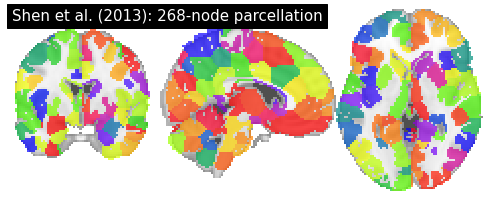

In [3]:
shen_file       = '../data_pieman/shen_2mm_268_parcellation.nii'
#shen_masker = nilearn.input_data.NiftiLabelsMasker(labels_img=shen_file);
#sample_file = '../data_pieman/func.nii'
#shen_masker.fit_transform(sample_file);

nilearn.plotting.plot_roi(shen_file, 
                  annotate = False, 
                  cut_coords = (5,0,0),
                  cmap = 'prism',
                  draw_cross = False, 
                  title= 'Shen et al. (2013): 268-node parcellation',
                 );

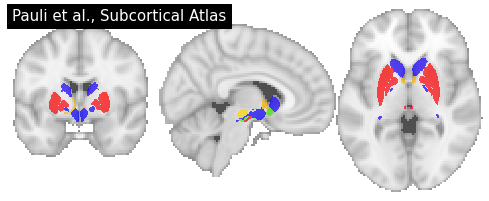

In [4]:
#Pauli
pauli_file       = '../data_pieman/pauli_2017_det.nii'
nilearn.plotting.plot_roi(pauli_file, 
                  annotate = False, 
                  cut_coords = (5,0,0),
                  cmap = 'prism',
                  draw_cross = False, 
                  title= 'Pauli et al., Subcortical Atlas',
                 );


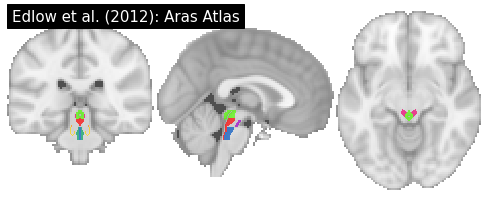

In [5]:
#AAN
aan_file       = '../data_pieman/aan_2012_det.nii'
nilearn.plotting.plot_roi(aan_file, 
                  annotate = False, 
                  cmap = 'prism',
                  draw_cross = False, 
                  title= 'Edlow et al. (2012): Aras Atlas',
                 );


In [6]:
s = '../data_pieman/shen_2mm_268_parcellation.nii'
simg = nilearn.image.load_img(s)
sdata = simg.get_fdata()
print(sdata.shape)

print(np.min(sdata))
print(np.max(sdata))

(91, 109, 91)
0.0
268.0


In [7]:
from nilearn.image import new_img_like

p = '../data_pieman/pauli_2017_det.nii'
pimg = nilearn.image.load_img(p)
pdata = pimg.get_fdata()
print(pdata.shape)

print(np.min(pdata))
print(np.max(pdata))

pdata = pdata+np.max(sdata)
pdata[np.where(pdata==np.max(sdata))] = 0
pdata = pdata.astype(int)


pauli_new_img = new_img_like(pimg, pdata.astype(int))
pauli_new_img_data = pauli_new_img.get_fdata()
print(pauli_new_img_data.shape)
print(np.min(pauli_new_img_data))
print(np.max(pauli_new_img_data))

pauli_new_img.to_filename('../data_pieman/pauli_increased.nii')

(198, 263, 212)
0.0
16.0
(198, 263, 212)
0.0
284.0


In [8]:
a = '../data_pieman/aan_2012_det.nii'
aimg = nilearn.image.load_img(a)
adata = aimg.get_fdata()
print(adata.shape)

print(np.min(adata))
print(np.max(adata))

adata = adata+np.max(pdata)
adata[np.where(adata==np.max(pdata))] = 0

aan_new_img = new_img_like(aimg, adata)
aan_new_img.to_filename('../data_pieman/aan_increased.nii')

(182, 218, 182)
0.0
9.0


In [9]:
from nilearn.image import resample_to_img


print(simg.get_fdata().shape)

resampled_A_to_S_img = resample_to_img(aan_new_img, simg)
print(resampled_A_to_S_img.get_fdata().shape)

resampled_P_to_S_img = resample_to_img(pauli_new_img, simg, interpolation = 'nearest')
print(resampled_P_to_S_img.get_fdata().shape)


(91, 109, 91)
(91, 109, 91)
(91, 109, 91)


In [10]:
resampled_A_to_S_img.to_filename('../data_pieman/atos.nii')

In [11]:
resampled_P_to_S_img.to_filename('../data_pieman/P_tos.nii')

In [12]:
aandata   = resampled_A_to_S_img.get_fdata()
print(aandata.shape)

paulidata = resampled_P_to_S_img.get_fdata().astype(int)
print(paulidata.shape)

shendata  = simg.get_fdata()
print(shendata.shape)


(91, 109, 91)
(91, 109, 91)
(91, 109, 91)


In [13]:
aandata[aandata<1] = 0
shendata[np.where(aandata>0)] = aandata[np.where(aandata>0)].astype(int)

paulidata[paulidata<1] = 0
shendata[np.where(paulidata>0)] = paulidata[np.where(paulidata>0)].astype(int)

all_new_img = new_img_like(simg, shendata)
all_new_img.to_filename('../data_pieman/allcombined.nii')

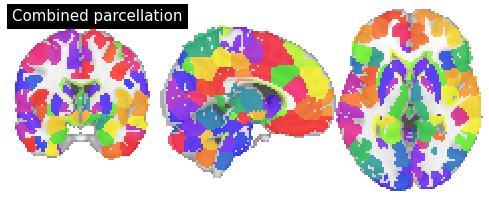

In [14]:
all_file       = '../data_pieman/allcombined.nii'

nilearn.plotting.plot_roi(all_file, 
                  annotate = False, 
                  cut_coords = (5,0,0),
                  cmap = 'prism',
                  draw_cross = False, 
                  title= 'Combined parcellation',
                 );


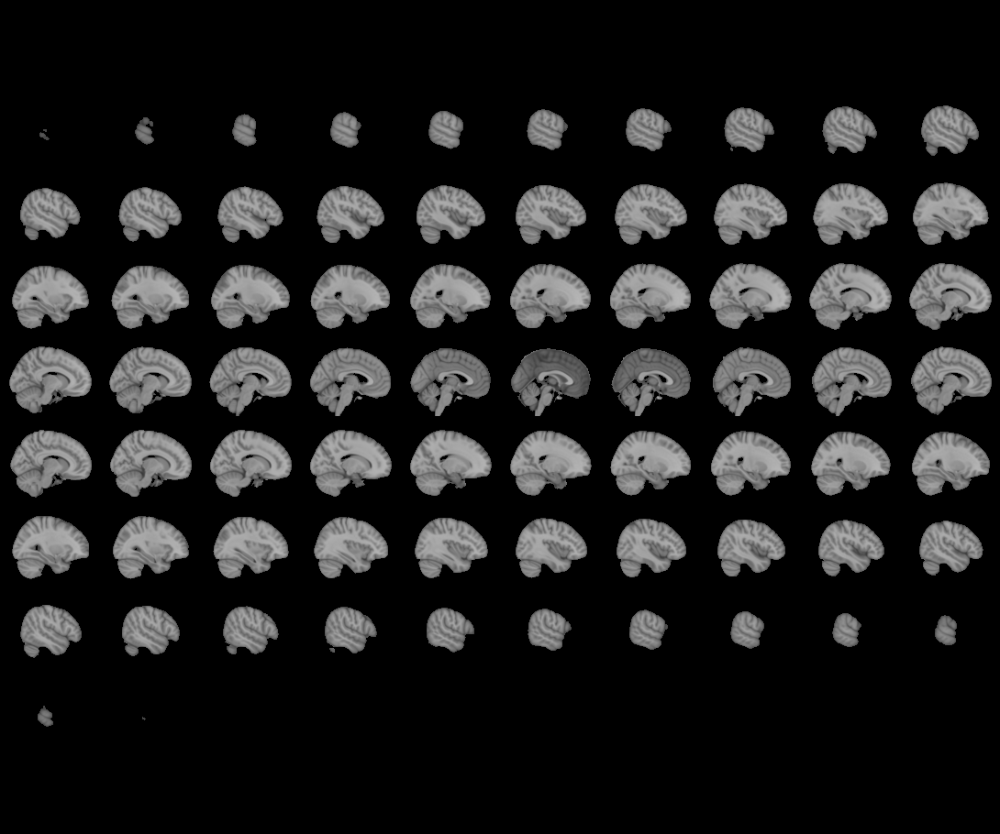
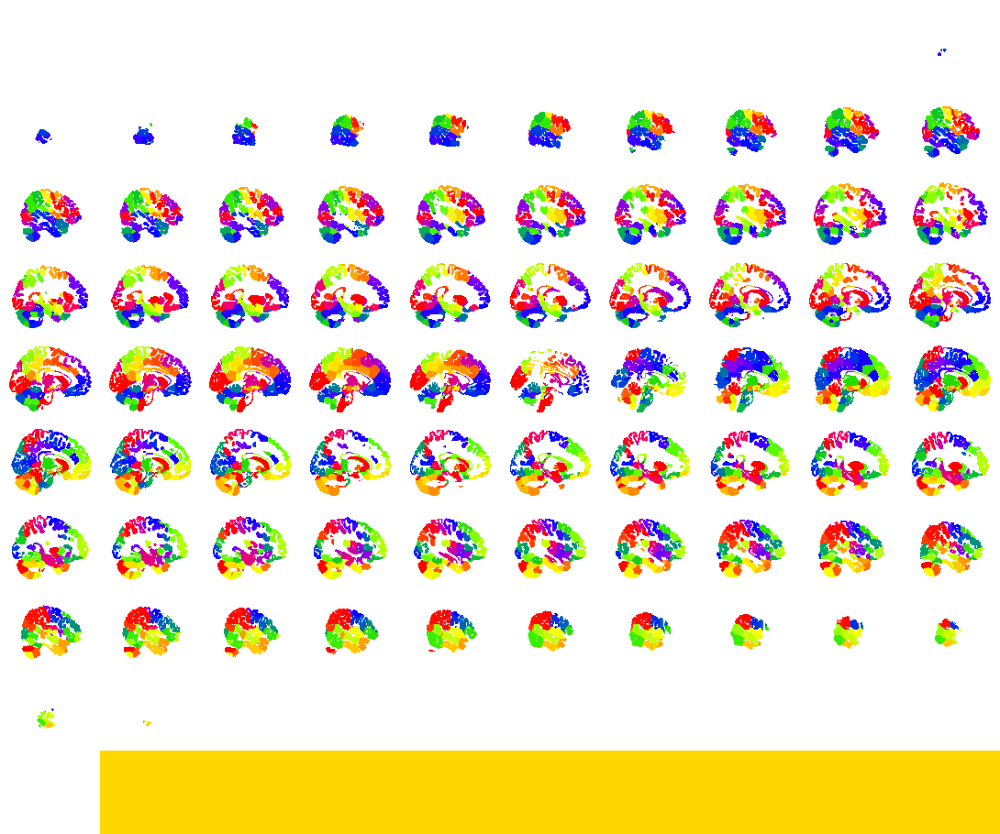

In [17]:
view = nilearn.plotting.view_img(all_file, 
                                 cmap = 'prism',
                                 );
view

In [41]:
shen_dict = np.load('../data_pieman/shen_dictionary.npy', allow_pickle=True).item()
shen_dict[1]['coords']


[14.083200000000005, 56.6944, -16.684799999999996]

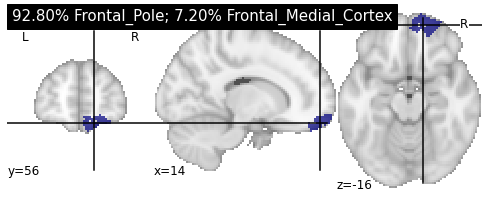

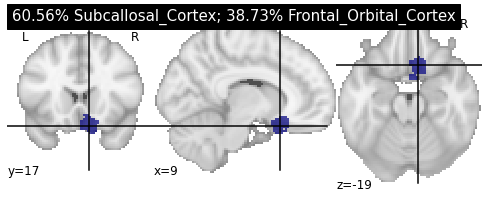

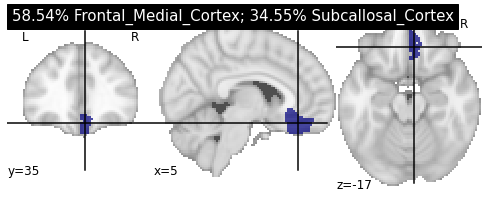

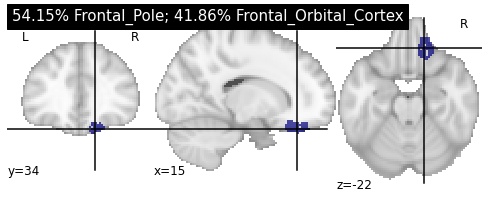

In [52]:
for current_value in range(1,5):

    all_img = nilearn.image.load_img(all_file)
    all_data = all_img.get_fdata()
    #print(all_data.shape)

    all_data[np.where(all_data!= current_value)] = 0
    all_new_img = new_img_like(all_img, all_data.astype(int))

    current_title = shen_dict[current_value]['name']

    plotting.plot_roi( all_new_img,
                       cut_coords = shen_dict[current_value]['coords'],
                       title = current_title);
    plt.show()

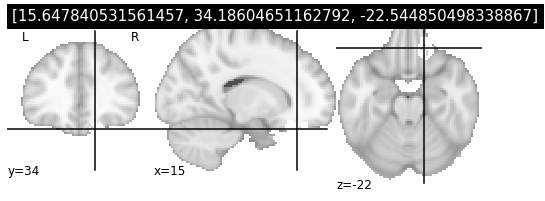

In [53]:

coords = plotting.find_xyz_cut_coords(all_new_img)
display = plotting.plot_stat_map(all_new_img, 
                                 cut_coords=coords, 
                                 colorbar=False,
                                 title= str(coords))

In [54]:
shen_dict[current_value]['coords']

[15.647840531561457, 34.18604651162792, -22.544850498338867]

In [56]:
shen_dict[269]['name'] = 'newname' 

KeyError: 269

In [62]:
shen_dict[268].keys()

dict_keys(['coords', 'name'])

In [63]:
shen_dict.keys()

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 22

In [64]:
shen_dict[268]

{'coords': [-5.697885196374628, -18.966767371601208, -36.81570996978852],
 'name': '100.00% Brain-Stem'}

In [76]:
shen_dict[269] = {'coords': [0.8504801097393653, 0.6063100137174189, 0.24691358024691112],
                  'name': 'Putamen'}

shen_dict[270] = {'coords': [0.5027237354085656, 6.9214007782101135, 7.962645914396887],
                  'name': 'Caudate'}

shen_dict[271] = {'coords': [0.6507936507936449, 7.69841269841271, -8.841269841269842],
                  'name': 'N Accumbens'}

shen_dict[272] = {'coords': [-1.0, 2.235294117647072, -0.3529411764705941],
                  'name': 'EXA'}

shen_dict[273] = {'coords': [0.4083769633507899, -0.9109947643979126, -0.46073298429318754],
                  'name': 'GlobPallE'}

shen_dict[274] = {'coords': [0.07272727272727764, -4.709090909090904, -3.9272727272727224],
                  'name': 'GlobPallI'}

shen_dict[275] = {'coords': [0.1025641025641022, -18.717948717948715, -12.410256410256409],
                  'name': 'SNC'}

shen_dict[276] = {'coords': [0.4347826086956559, -18.97826086956522, -8.5],
                  'name': 'RN'}

shen_dict[277] = {'coords': [0.14634146341462895, -15.902439024390247, -11.853658536585364],
                  'name': 'SNR'}

shen_dict[278] = {'coords': [-0.3125, -18.0625, -11.0],
                  'name': 'PBP'}

shen_dict[279] = {'coords': [-0.6153846153846132, -20.0, -14.92307692307692],
                  'name': 'VTA'}

shen_dict[280] = {'coords': [0.7586206896551744, 2.620689655172413, -7.65517241379311],
                  'name': 'VeP'}

shen_dict[281] = {'coords': [0.0, -22.5, 2.8333333333333286],
                  'name': 'HN'}

shen_dict[282] = {'coords': [0.4824120603015132, -4.1507537688442255, -8.78391959798995],
                  'name': 'HTH'}

shen_dict[283] = {'coords': [0.1599999999999966, -7.680000000000007, -13.04],
                  'name': 'MN'}

shen_dict[284] = {'coords': [-0.08888888888888857, -14.533333333333331, -8.088888888888889],
                  'name': 'STH'}

shen_dict[285] = {'coords': [0.625, -33.5625, -19.9375],
                  'name': 'Dorsal Raphe'}

shen_dict[286] = {'coords': [0.4285714285714306, -36.85714285714286, -28.0],
                  'name': 'Locus Coeruleus'}

shen_dict[287] = {'coords': [-0.13333333333333997, -31.599999999999994, -23.0],
                  'name': 'Median Raphe'}

shen_dict[288] = {'coords': [1.0499999999999972, -28.950000000000003, -9.600000000000001],
                  'name': 'MRF'}

shen_dict[289] = {'coords': [1.1111111111111143, -33.77777777777777, -26.333333333333336],
                  'name': 'Parabrachial Complex'}

shen_dict[290] = {'coords': [0.7741935483871032, -33.29032258064517, -28.645161290322584],
                  'name': 'Pontis Oralis'}

shen_dict[291] = {'coords': [0.5999999999999943, -24.400000000000006, -18.799999999999997],
                  'name': 'Ventral Tegmental Area'}

shen_dict[292] = {'coords': [1.5555555555555571, -27.22222222222223, -16.22222222222222],
                  'name': 'Pedunculopontine Nucleus'}

shen_dict[293] = {'coords': [0.7586206896551744, -32.27586206896552, -10.448275862068968],
                  'name': 'Periaqueductal Gray'}


In [88]:
for i in range(1,294):
    curr_dict = shen_dict[i]
    curr_dict['index_label'] = i
    curr_dict['data_array_index'] = i-1
    shen_dict[i] = curr_dict

In [90]:
shen_dict[293]

{'coords': [0.7586206896551744, -32.27586206896552, -10.448275862068968],
 'name': 'Periaqueductal Gray',
 'index_label': 293,
 'data_array_index': 292}

In [91]:
shen_paui_aan_dict = shen_dict.copy()
np.save("../data_pieman/shen_pauli_aan_dict.npy", shen_paui_aan_dict)

In [92]:
my_dict = np.load('../data_pieman/shen_pauli_aan_dict.npy', allow_pickle=True).item()
my_dict[1]

{'coords': [14.083200000000005, 56.6944, -16.684799999999996],
 'name': '92.80% Frontal_Pole; 7.20% Frontal_Medial_Cortex',
 'index_label': 1,
 'data_array_index': 0}

1


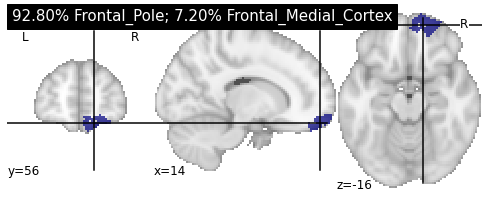

2


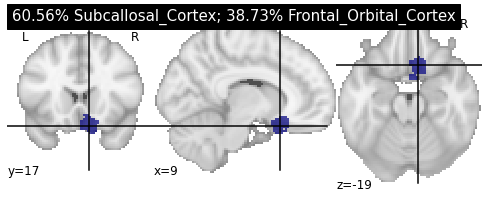

3


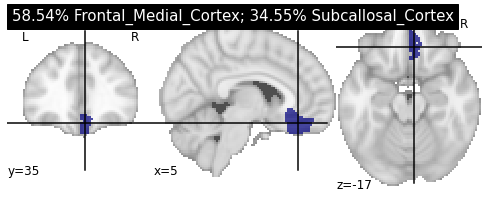

4


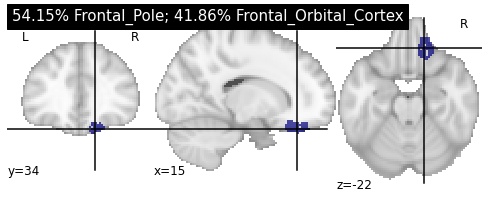

5


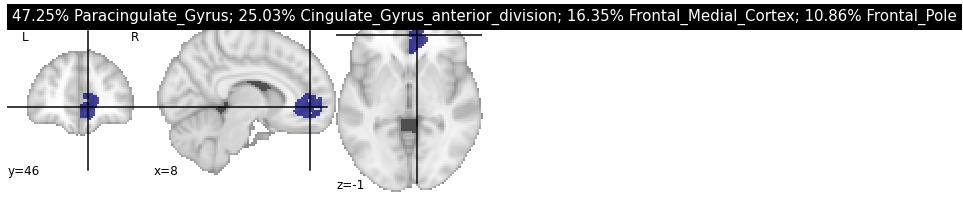

6


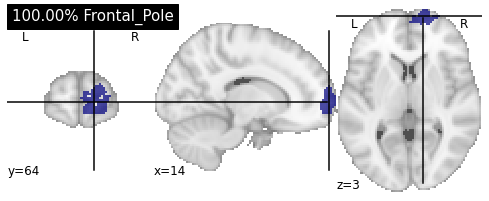

7


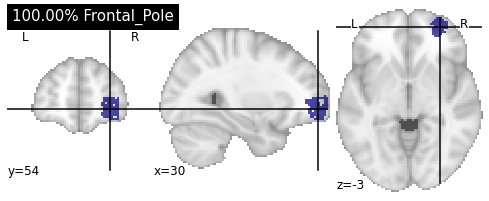

8


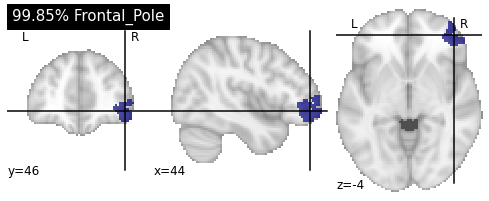

9


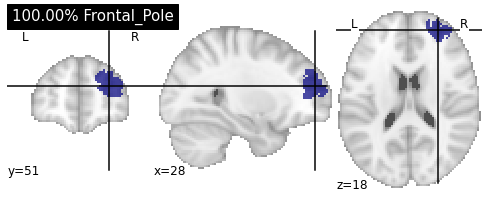

10


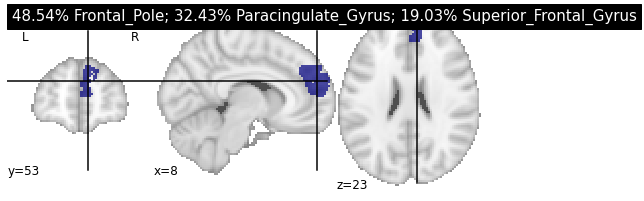

11


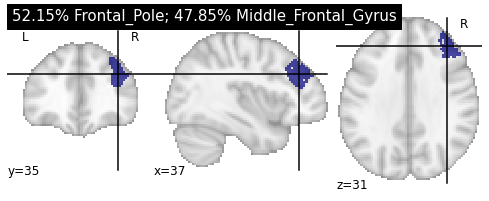

12


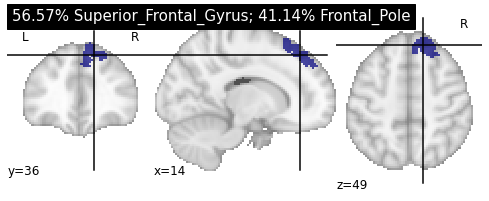

13


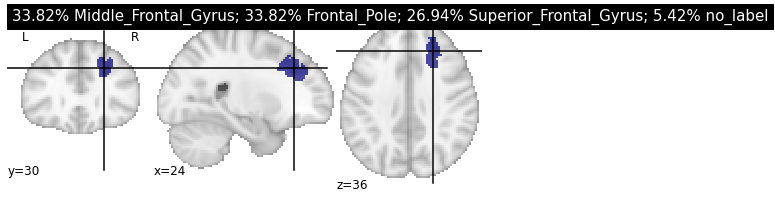

14


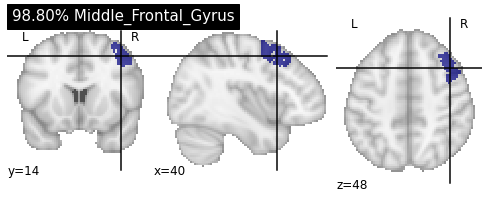

15


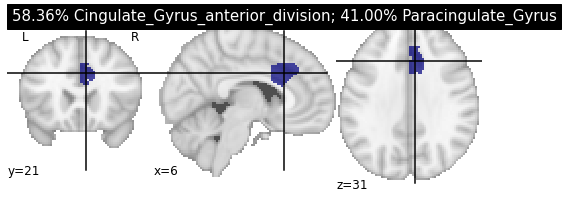

16


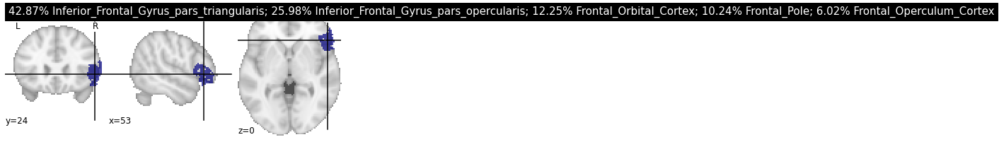

17


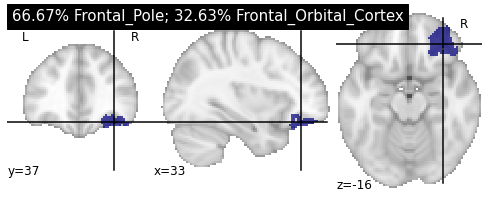

18


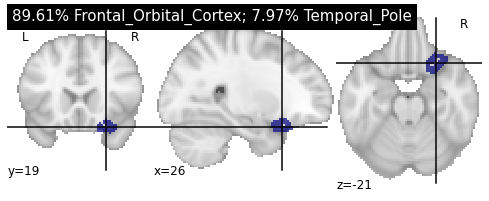

19


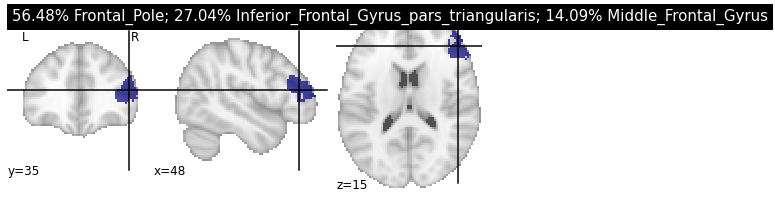

20


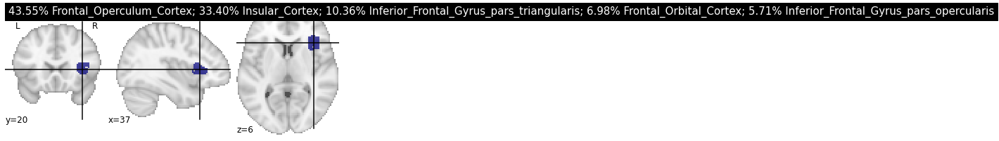

21


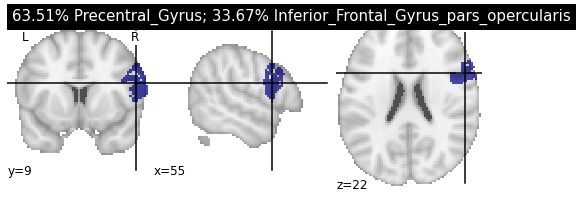

22


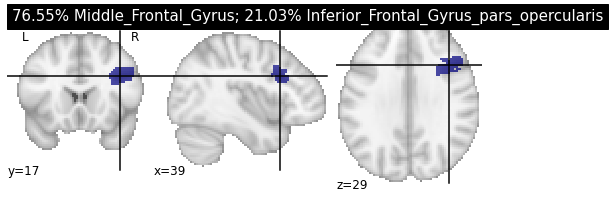

23


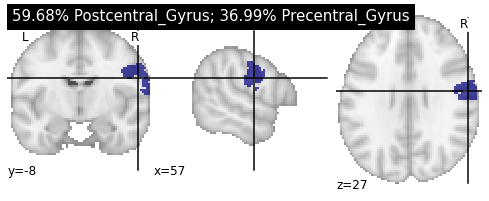

24


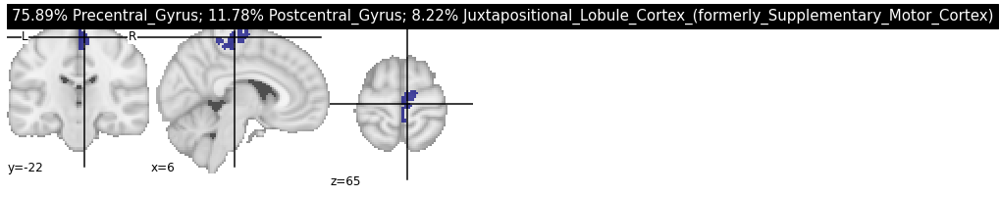

25


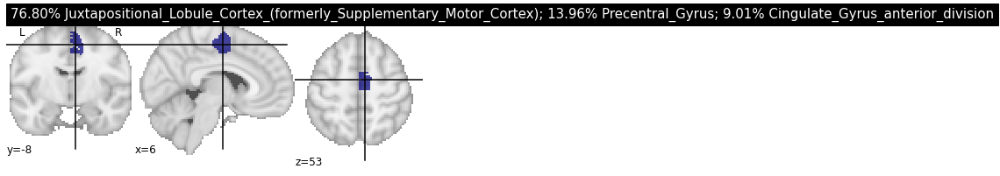

26


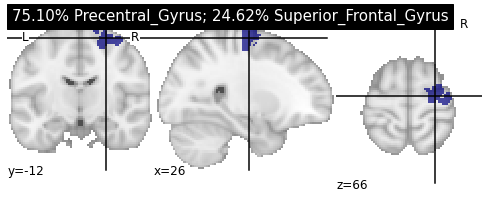

27


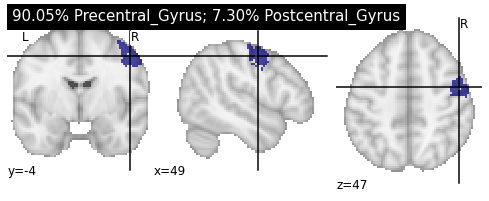

28


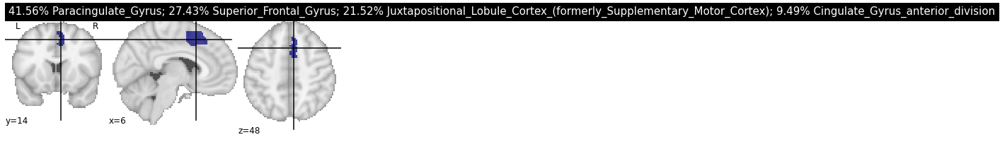

29


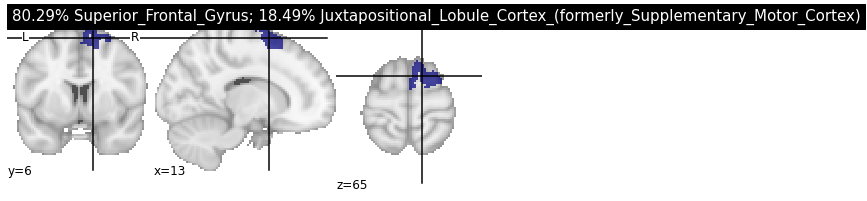

30


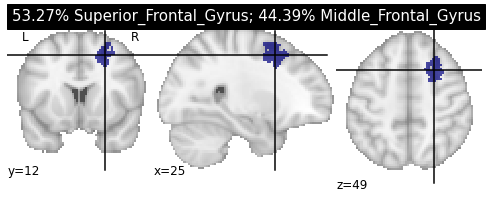

31


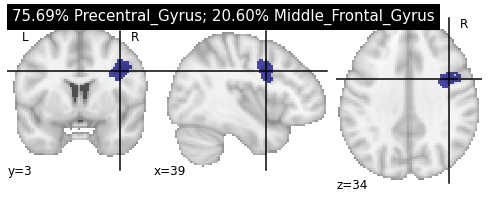

32


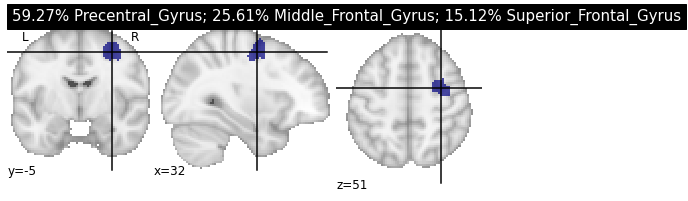

33


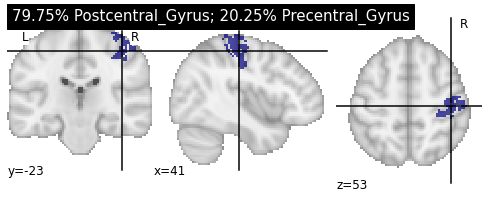

34


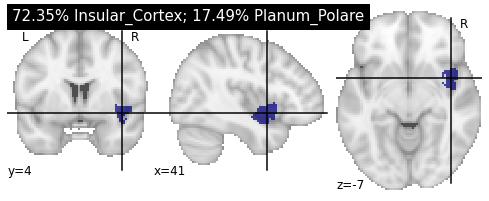

35


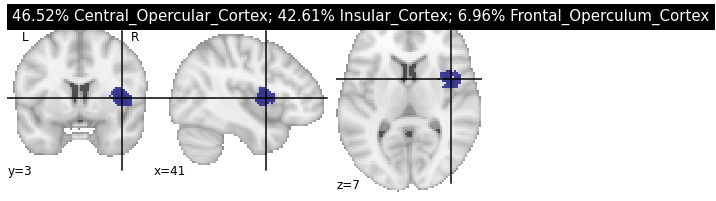

36


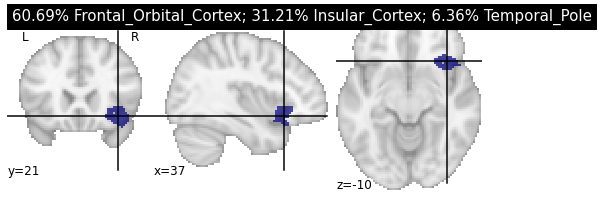

37


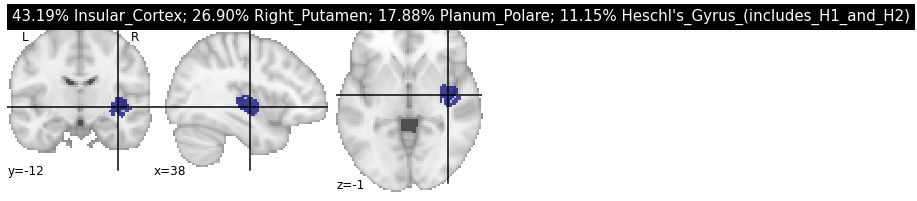

38


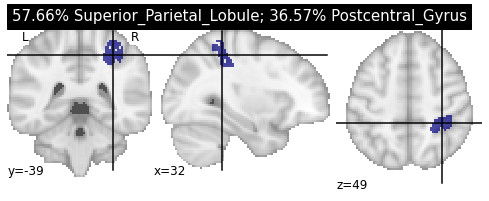

39


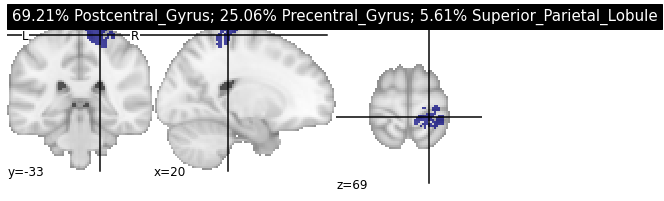

40


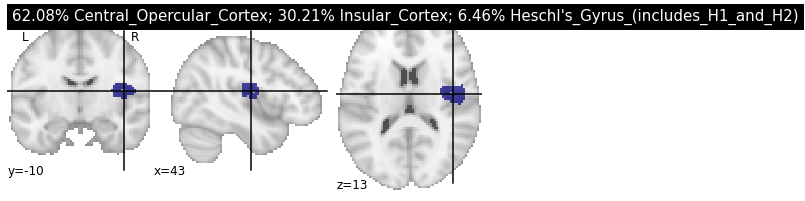

41


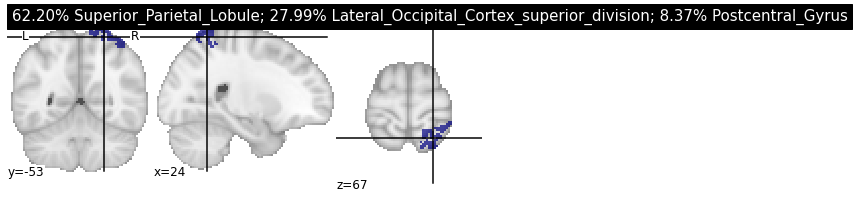

42


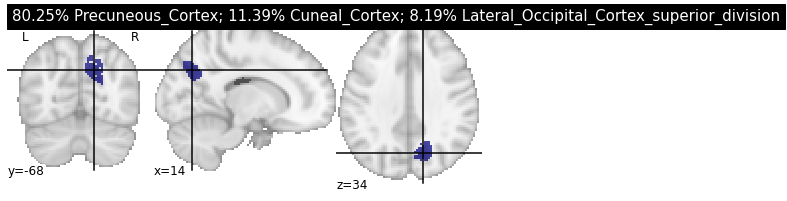

43


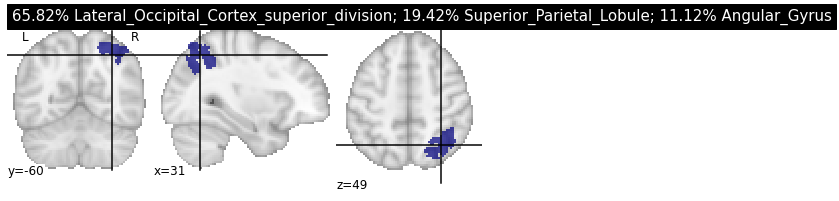

44


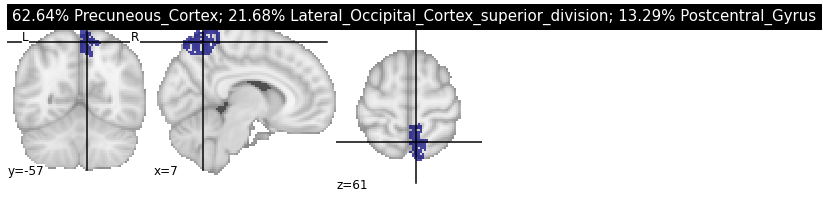

45


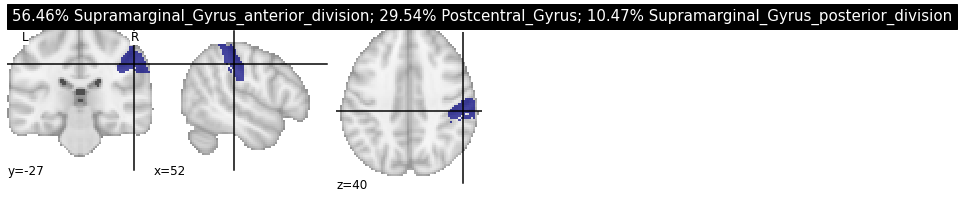

46


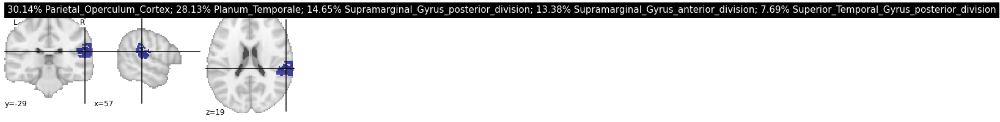

47


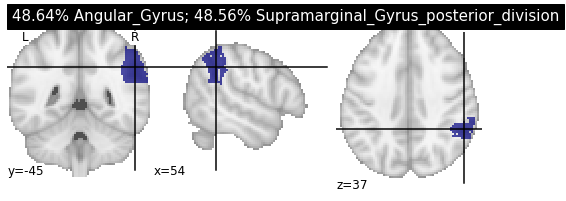

48


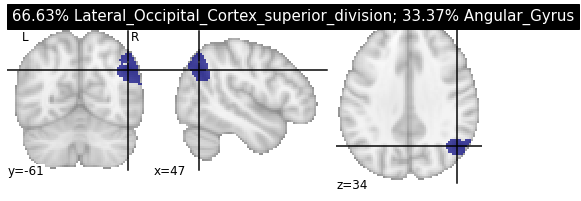

49


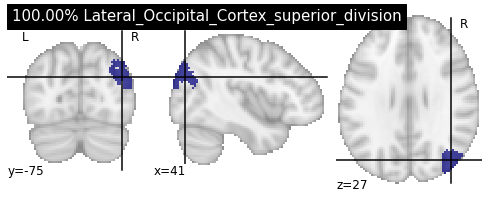

50


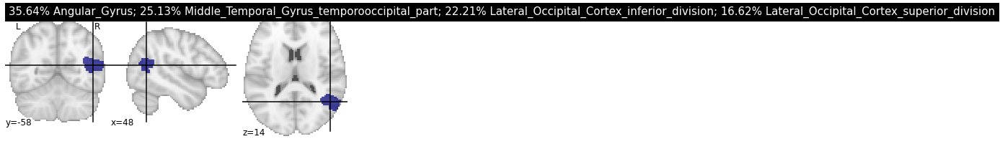

51


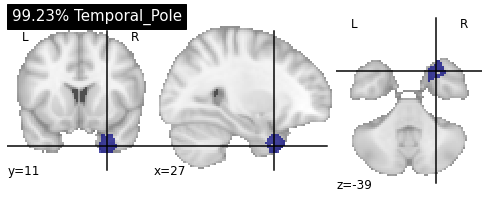

52


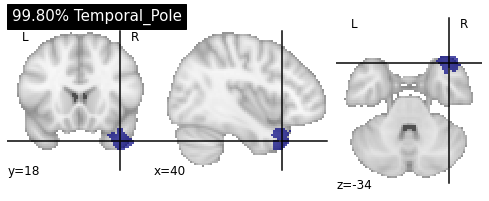

53


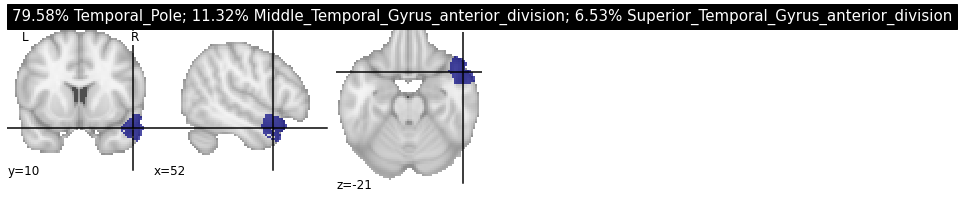

54


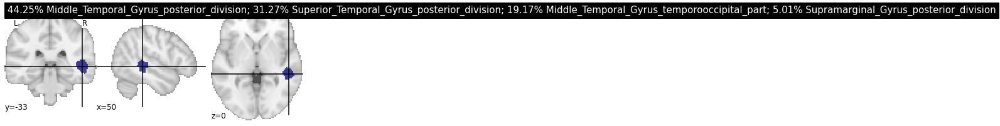

55


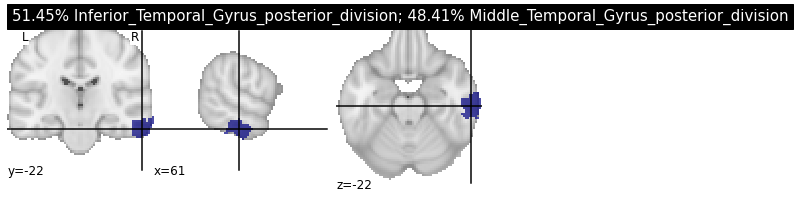

56


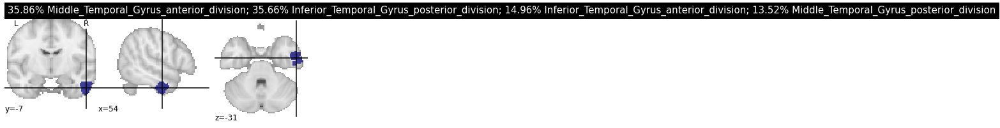

57


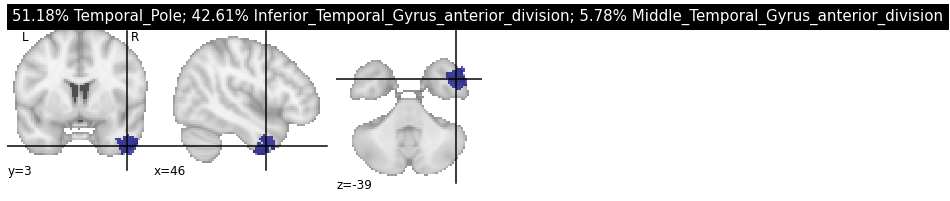

58


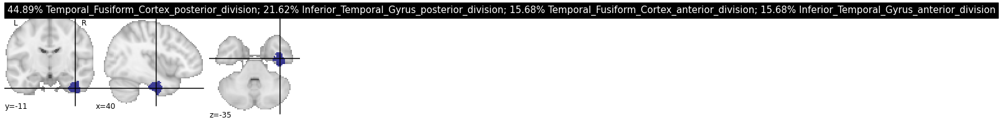

59


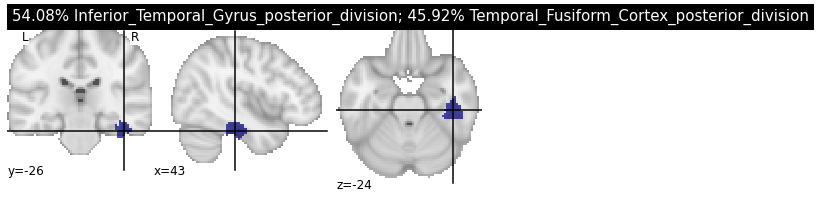

60


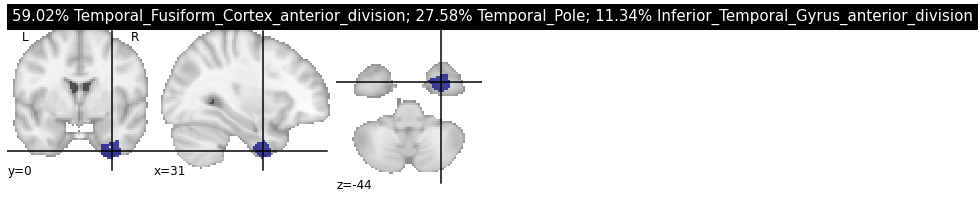

61


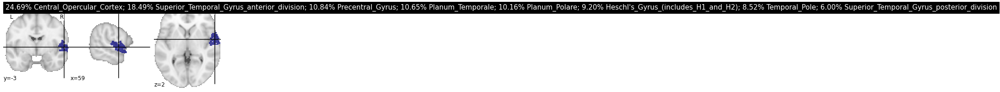

62


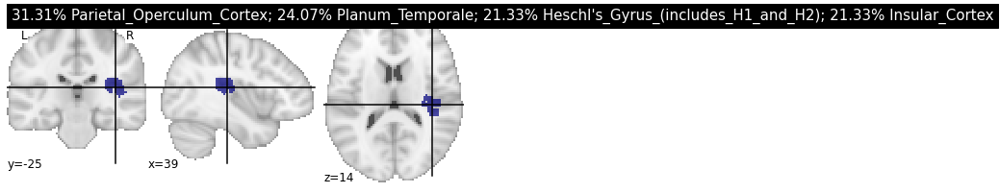

63


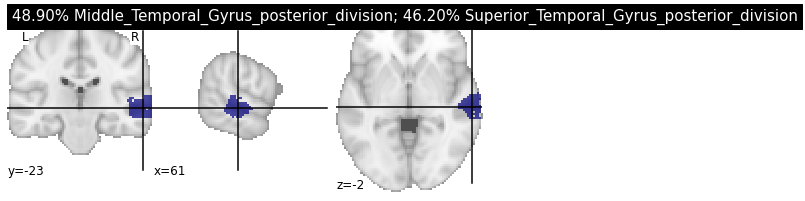

64


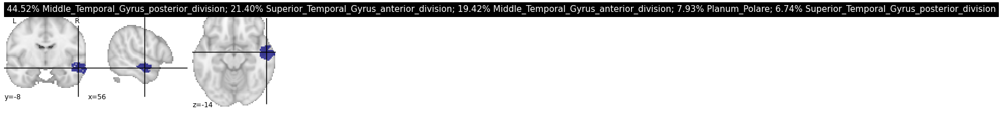

65


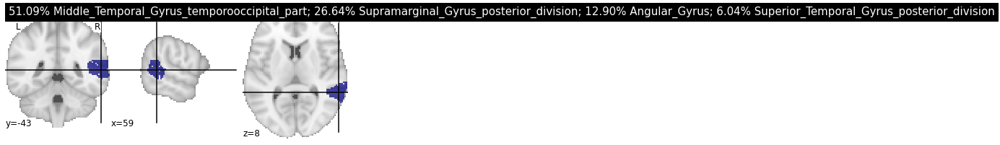

66


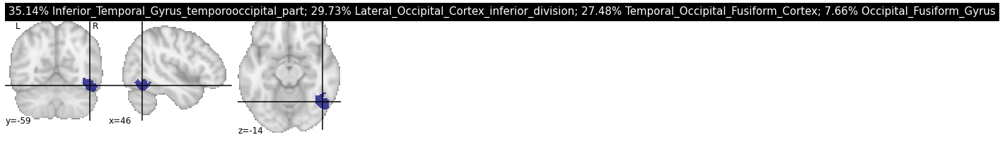

67


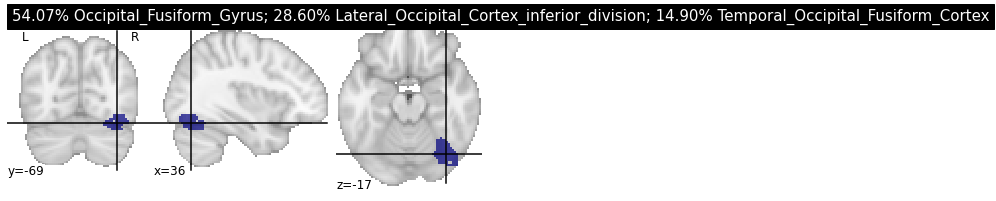

68


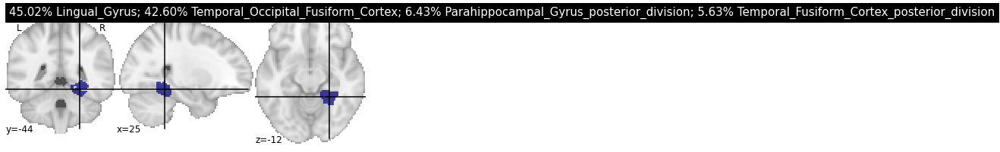

69


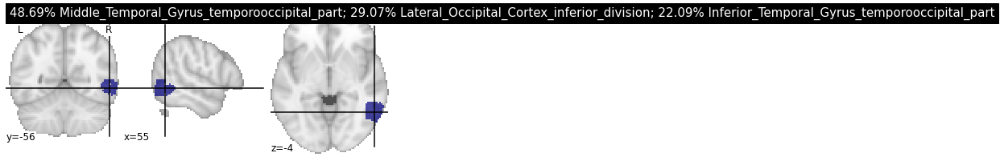

70


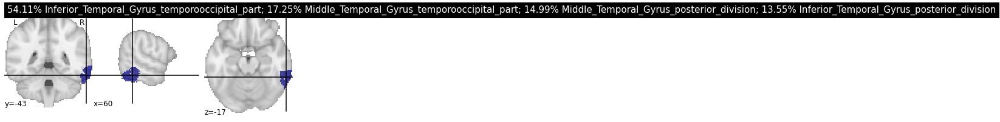

71


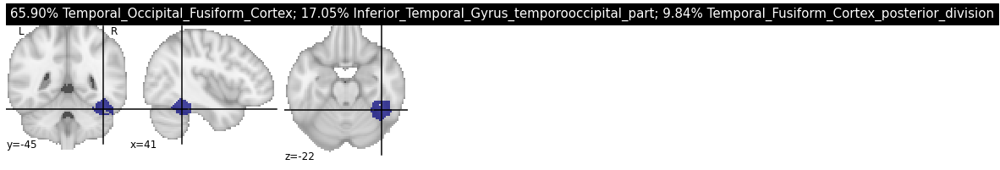

72


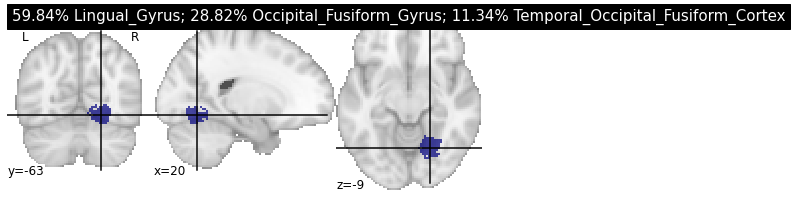

73


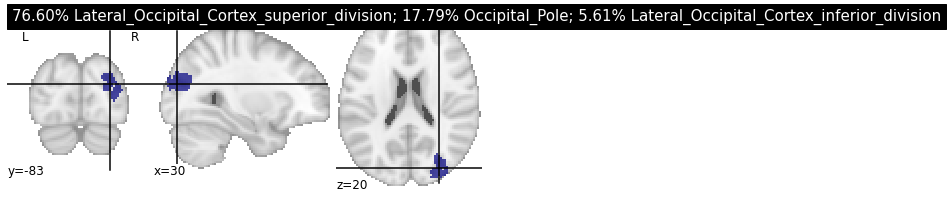

74


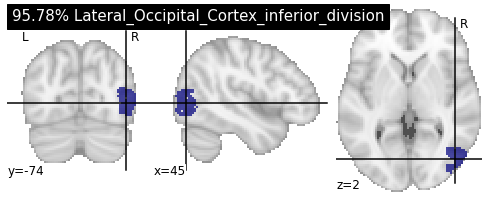

75


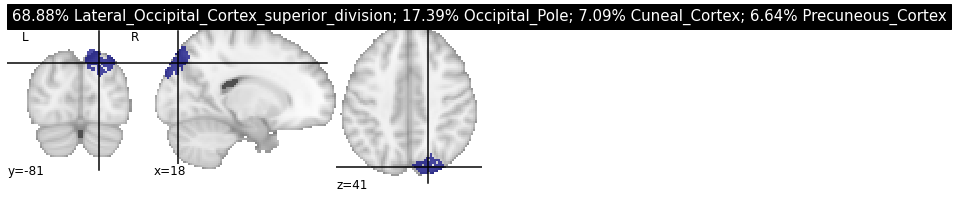

76


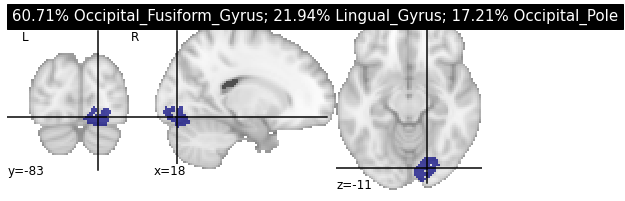

77


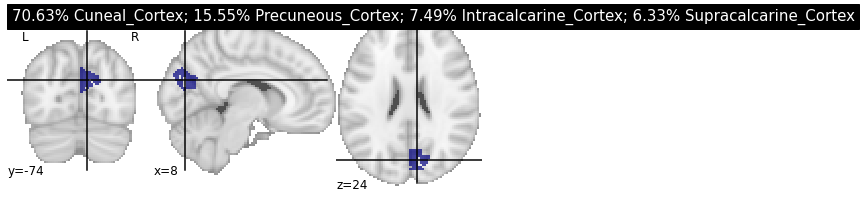

78


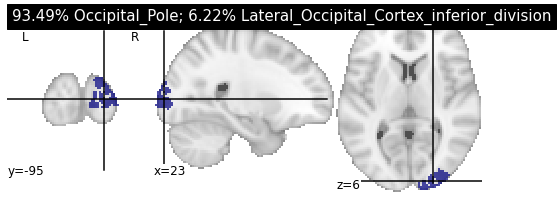

79


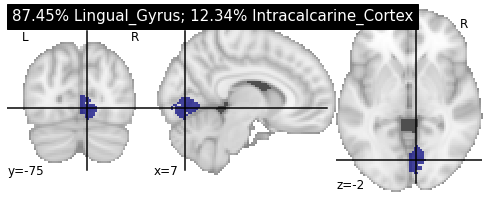

80


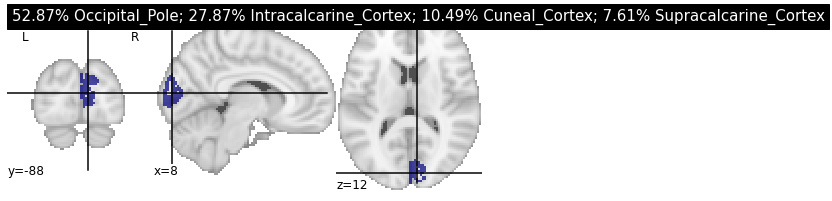

81


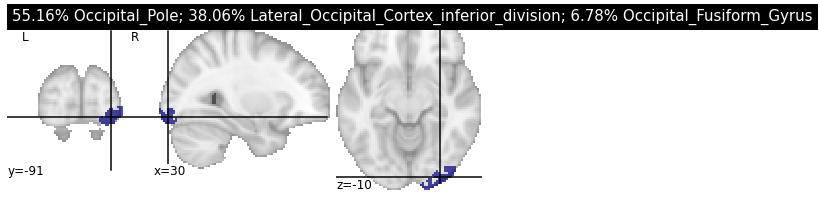

82


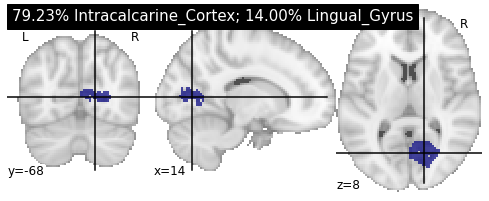

83


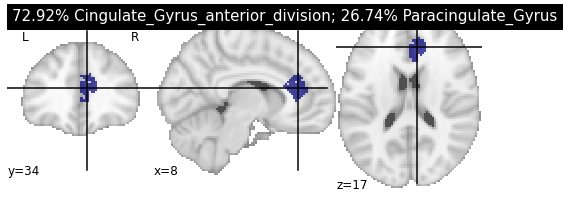

84


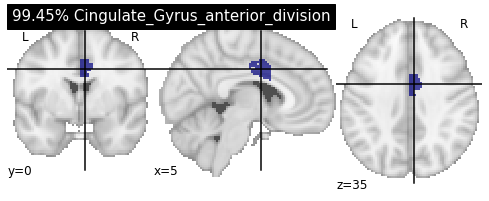

85


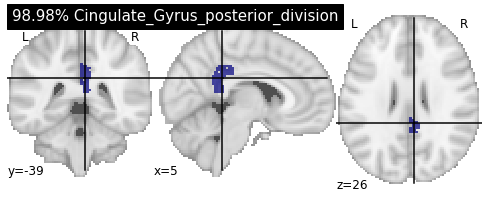

86


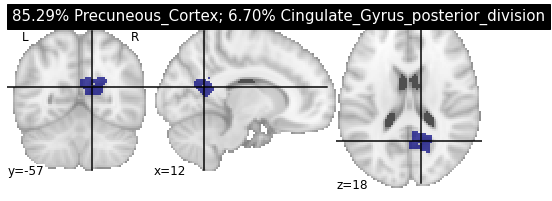

87


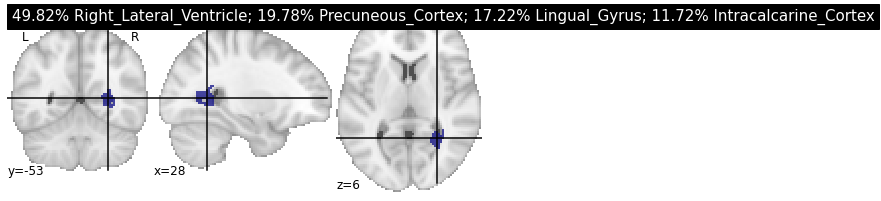

88


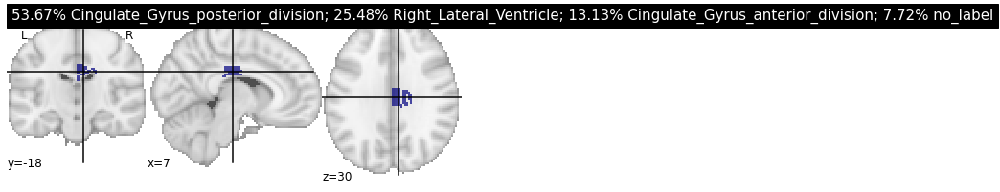

89


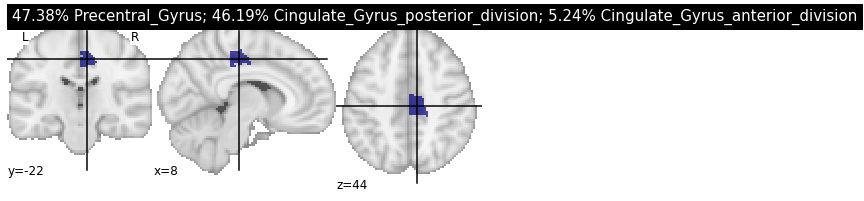

90


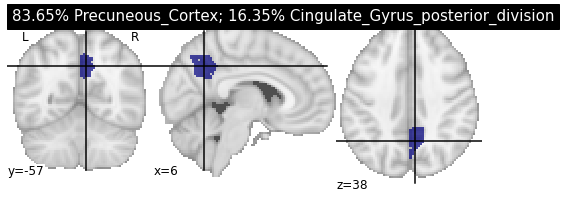

91


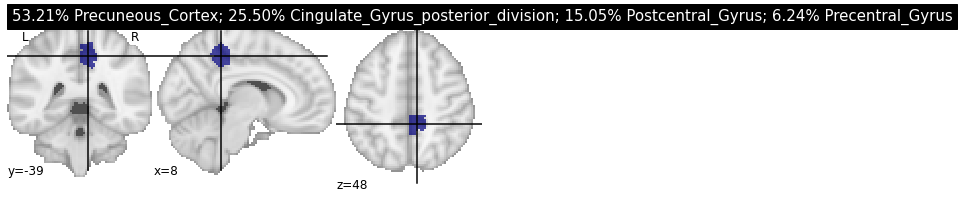

92


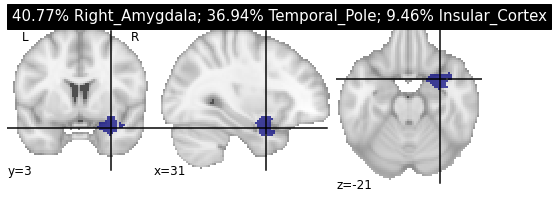

93


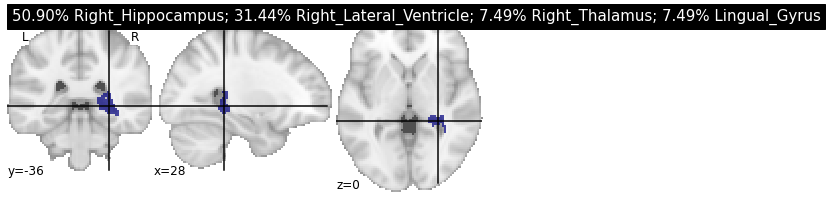

94


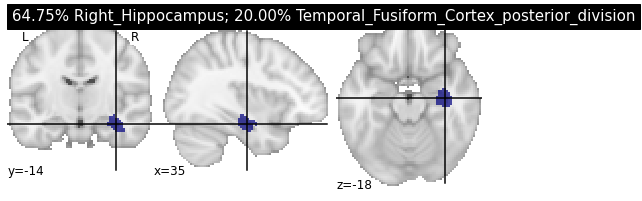

95


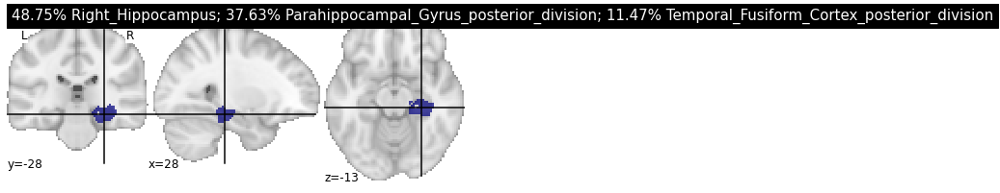

96


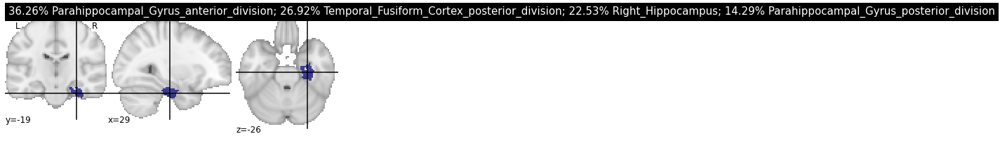

97


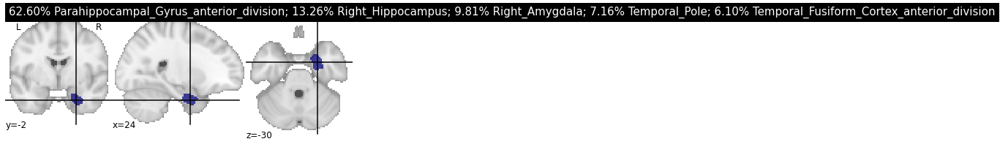

98


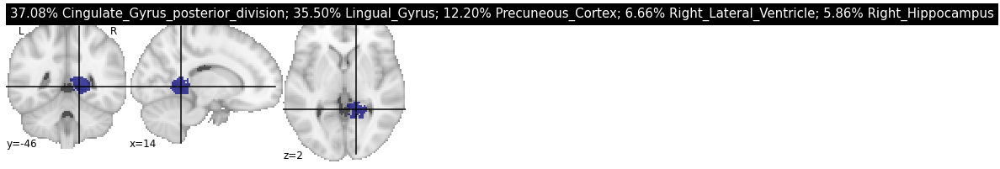

99


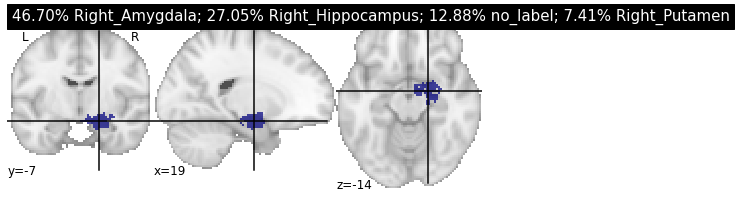

100


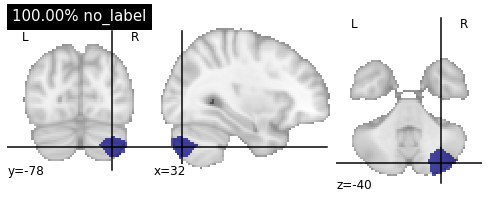

101


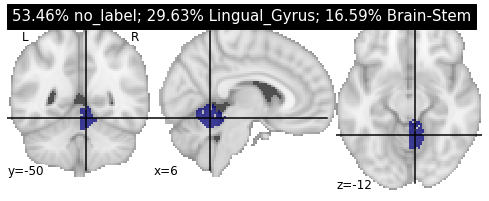

102


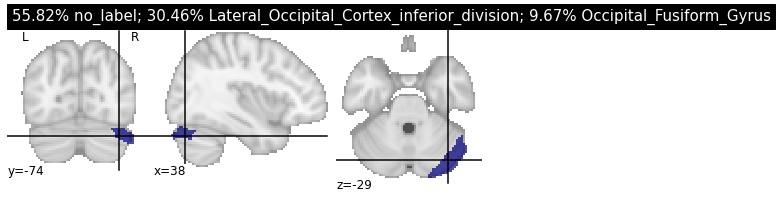

103


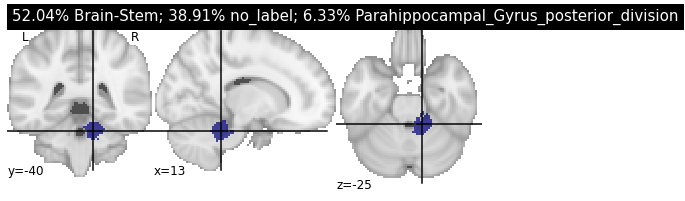

104


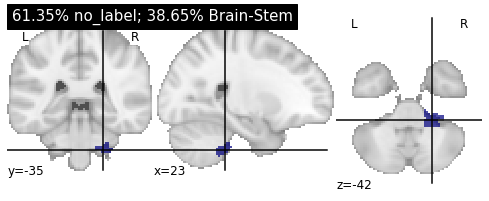

105


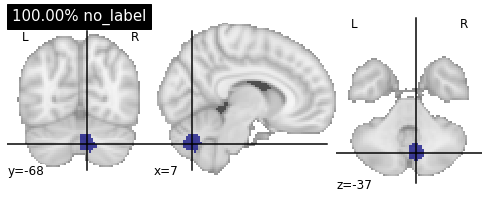

106


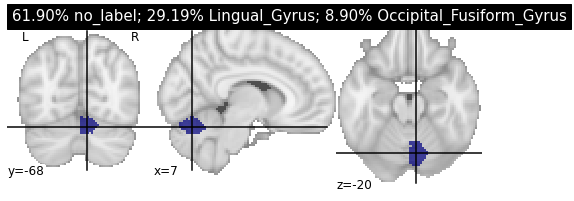

107


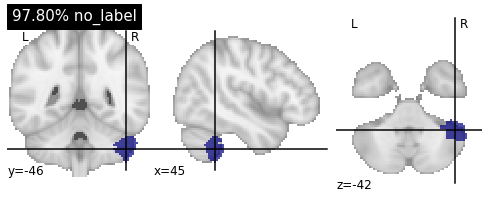

108


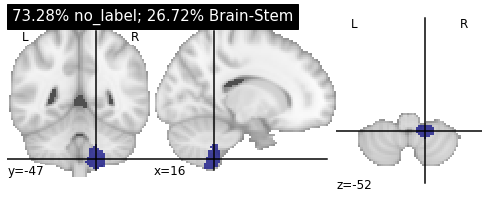

109


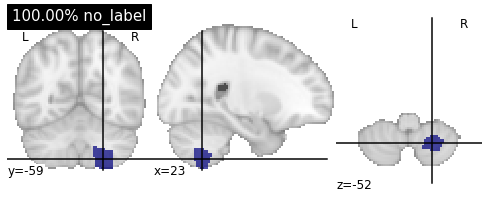

110


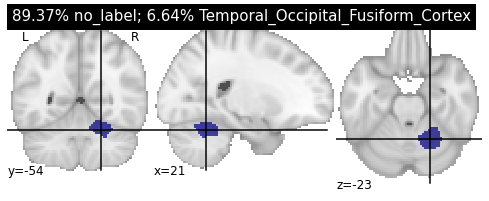

111


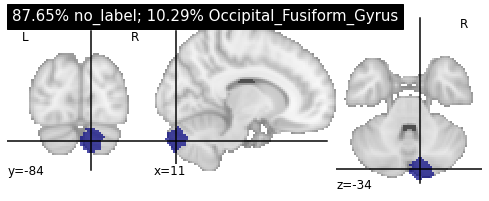

112


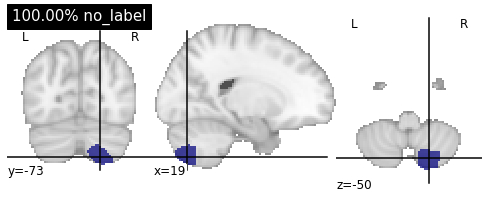

113


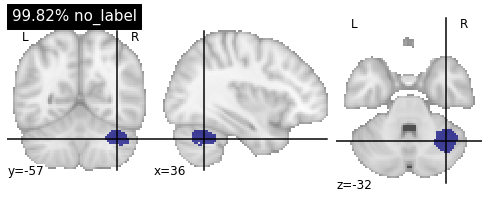

114


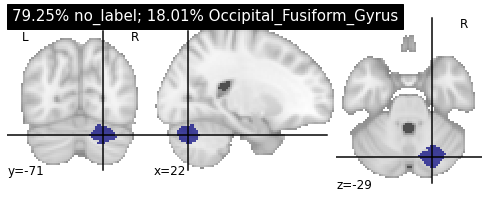

115


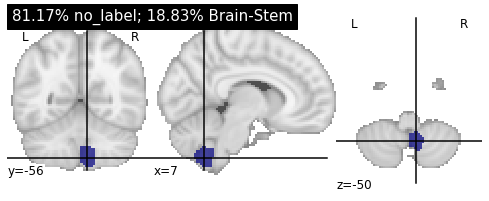

116


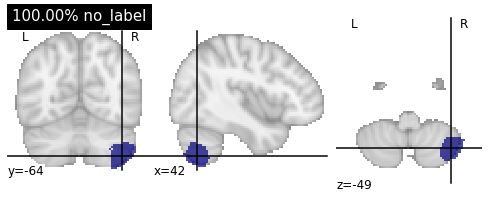

117


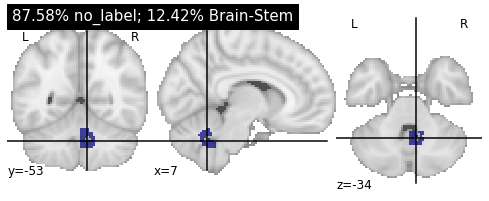

118


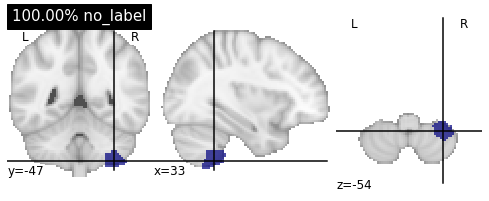

119


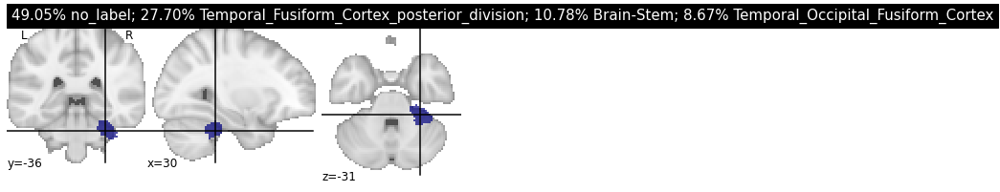

120


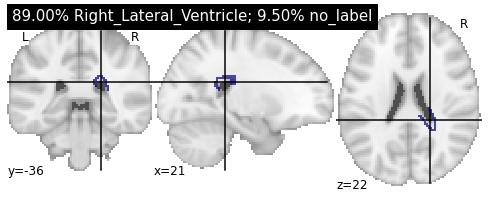

121


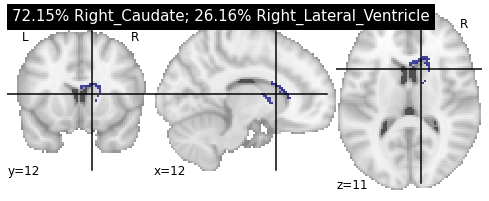

122


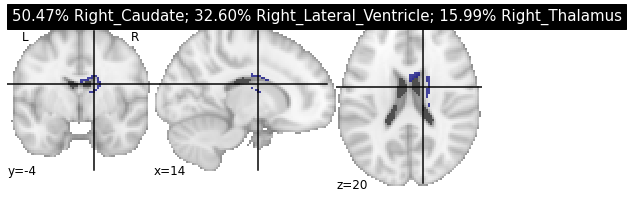

123


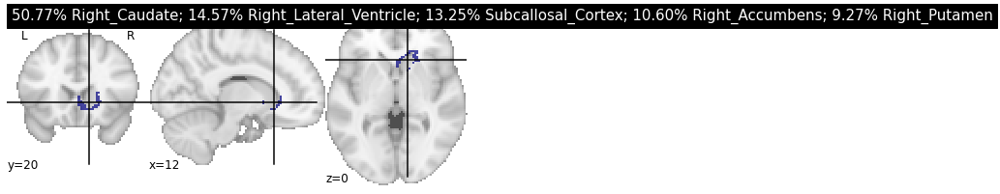

124


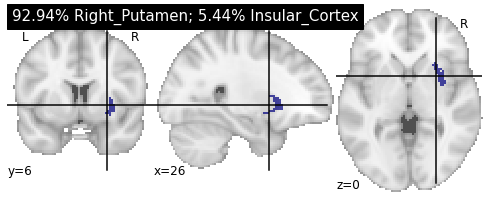

125


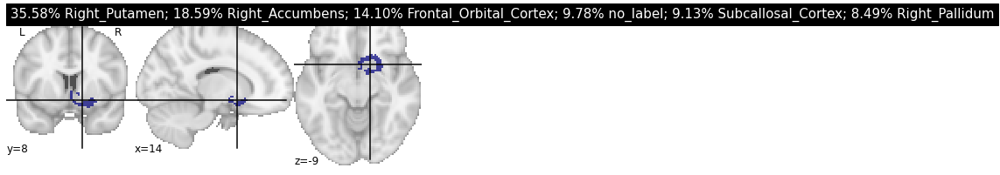

126


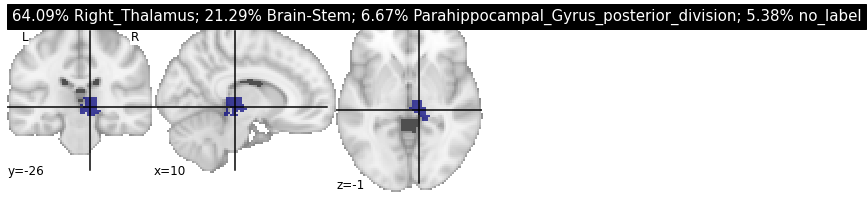

127


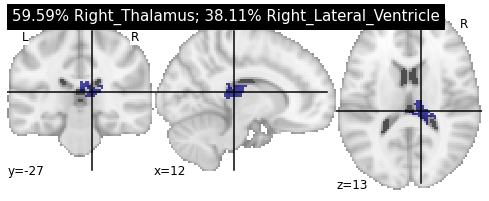

128


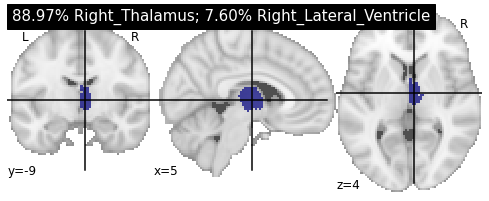

129


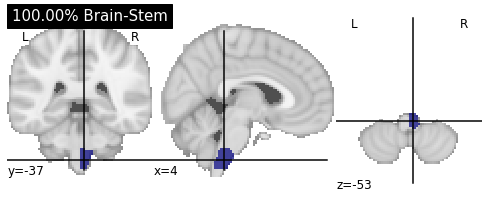

130


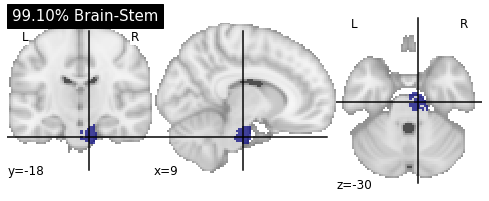

131


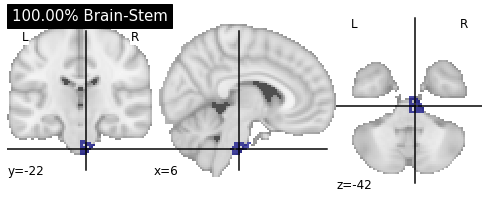

132


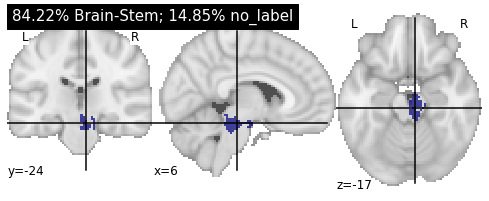

133


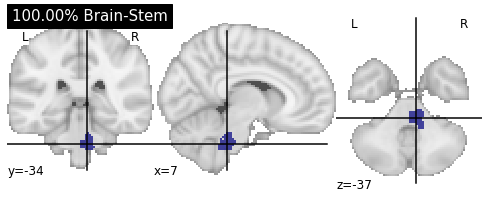

134


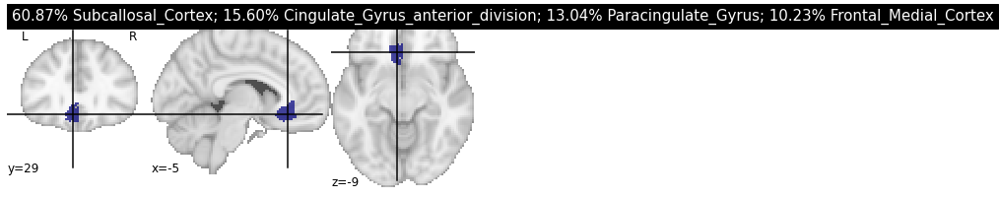

135


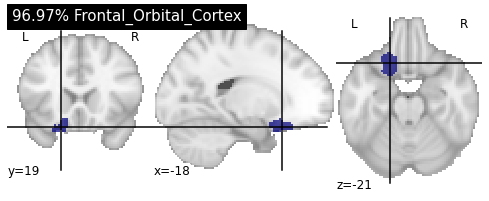

136


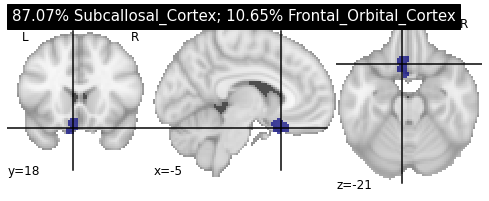

137


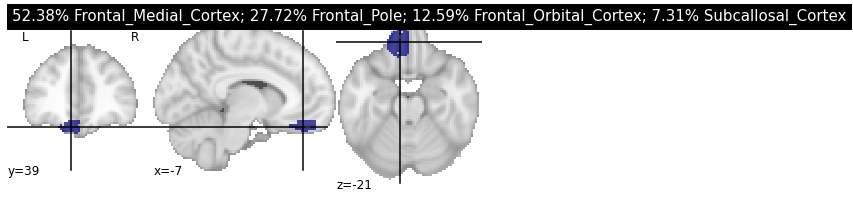

138


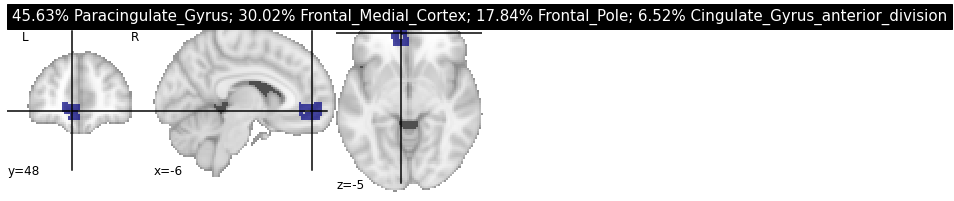

139


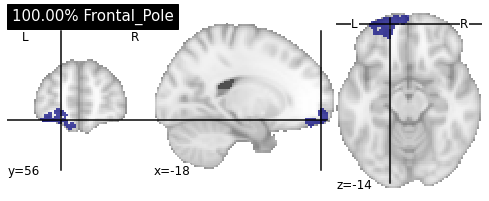

140


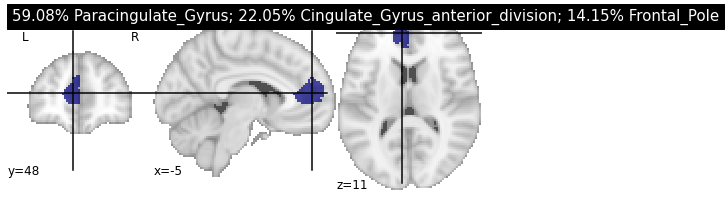

141


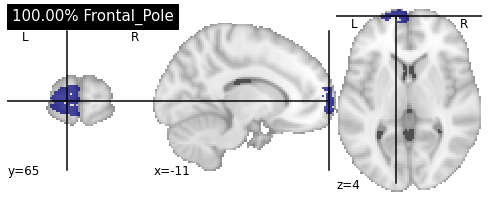

142


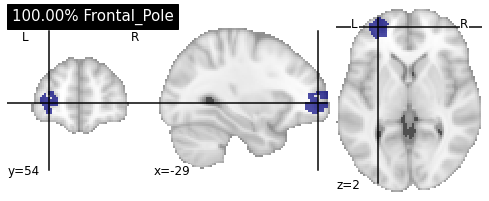

143


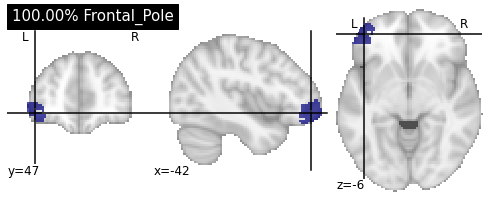

144


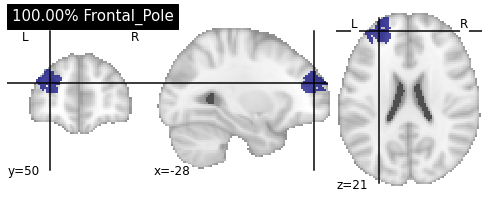

145


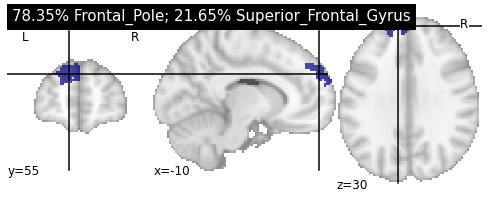

146


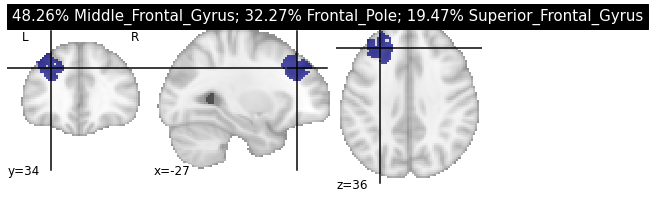

147


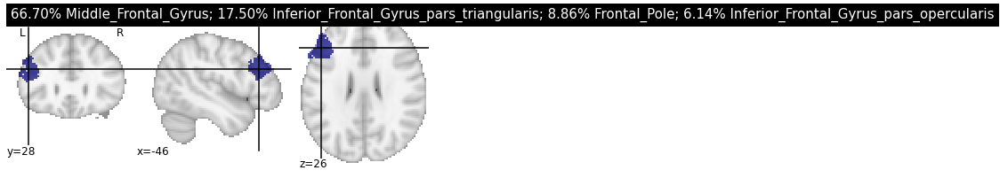

148


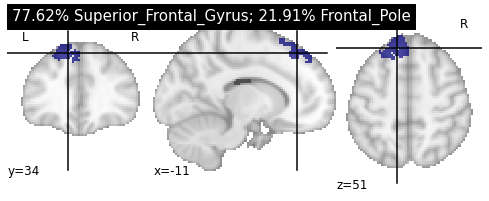

149


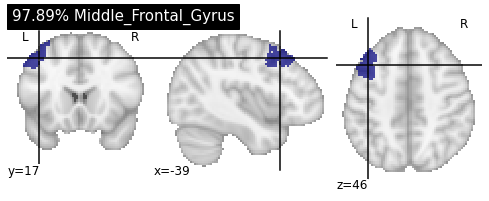

150


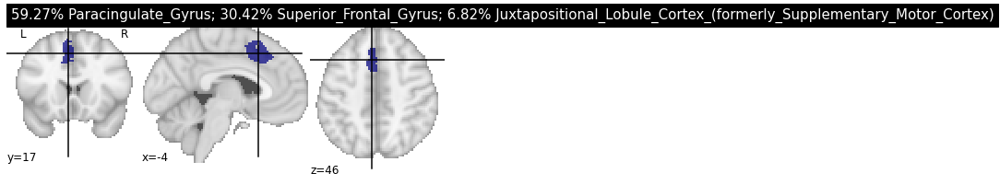

151


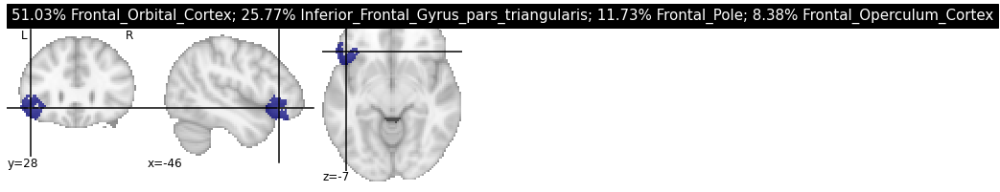

152


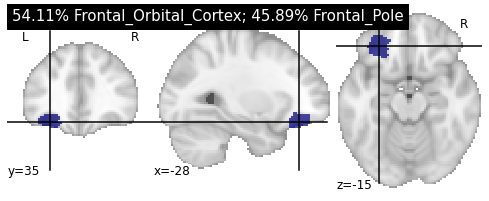

153


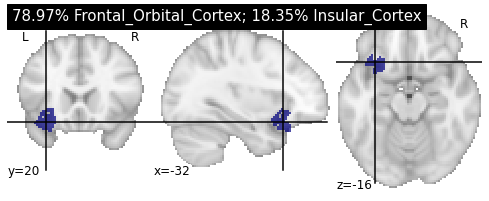

154


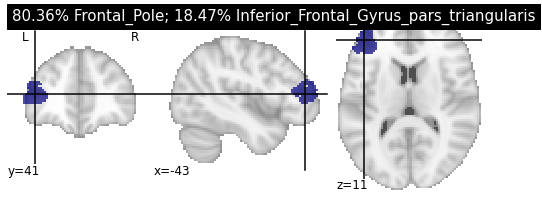

155


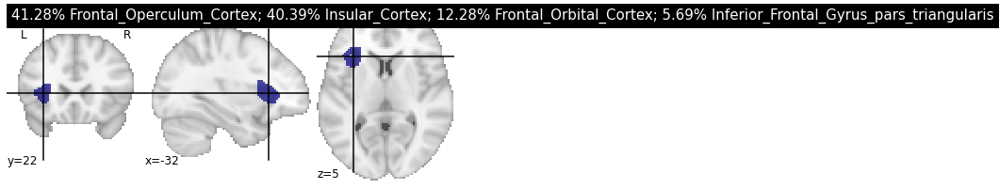

156


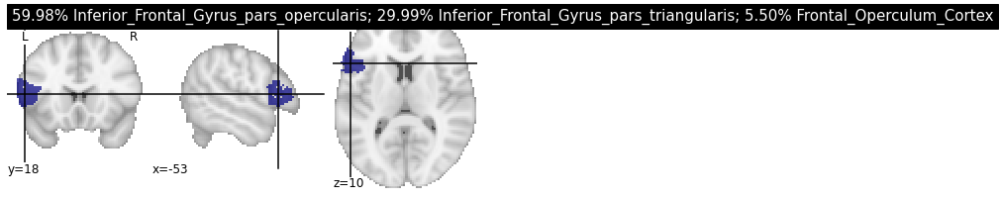

157


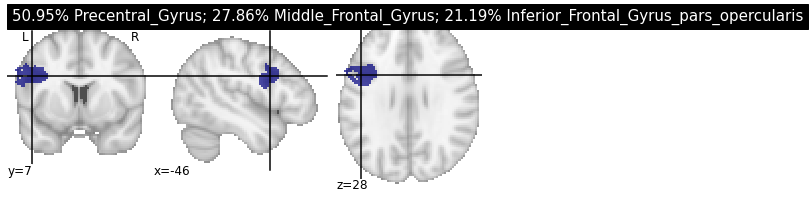

158


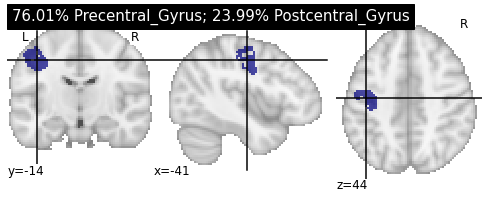

159


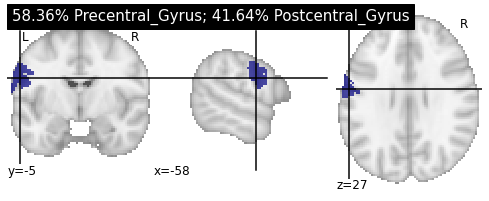

160


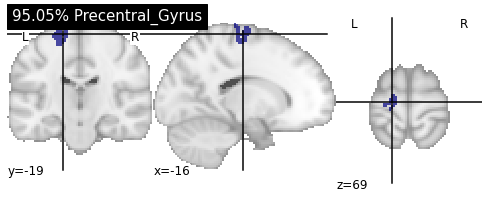

161


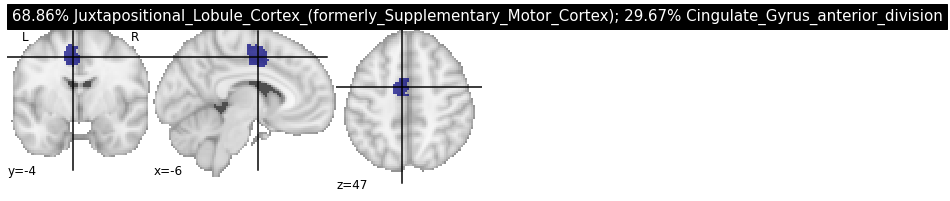

162


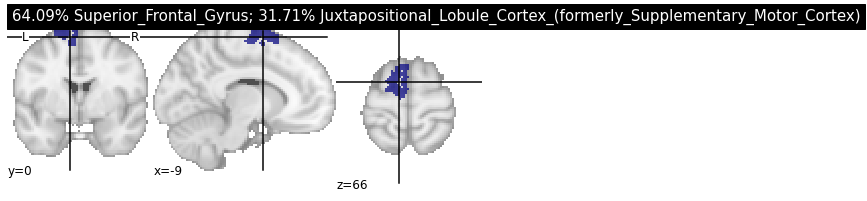

163


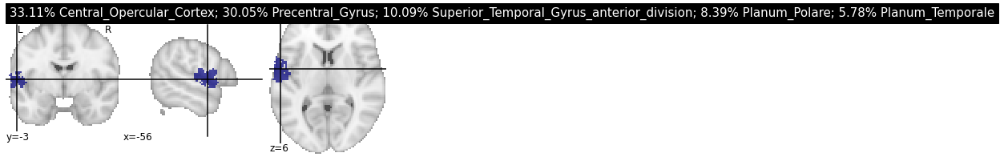

164


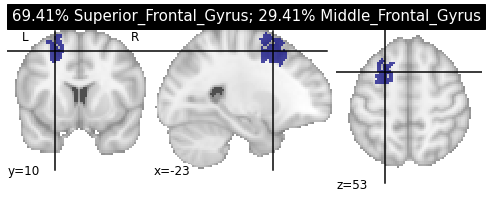

165


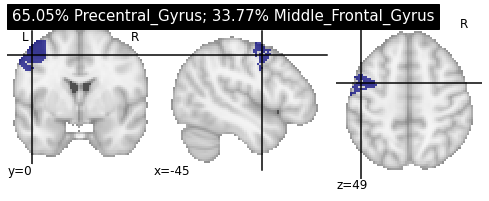

166


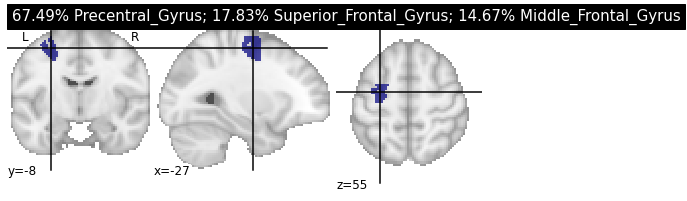

167


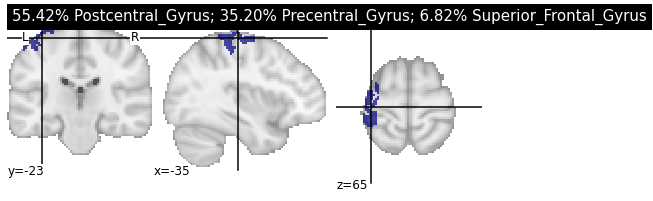

168


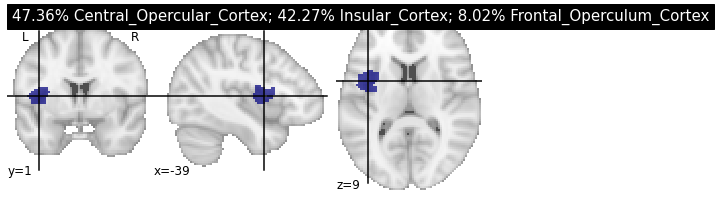

169


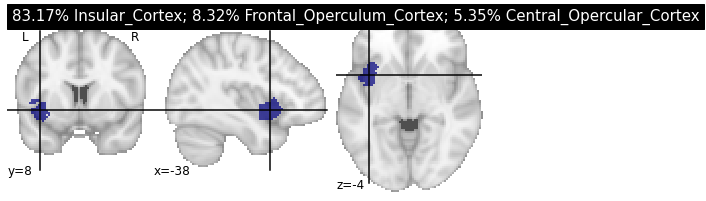

170


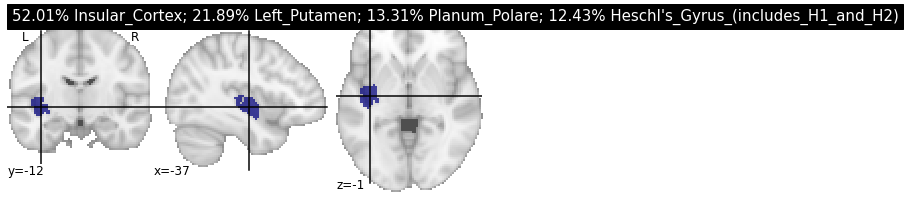

171


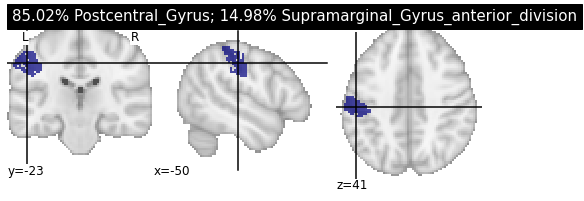

172


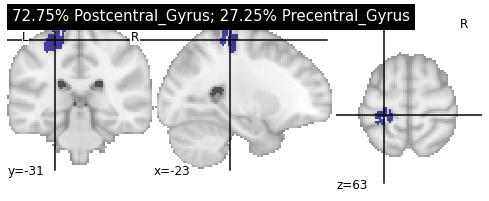

173


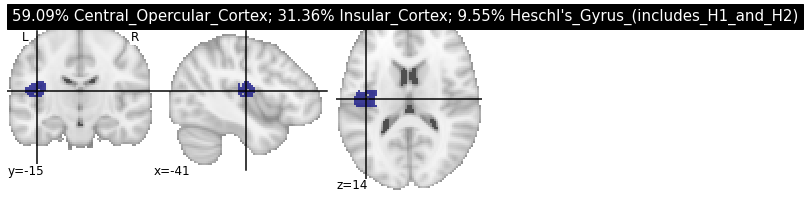

174


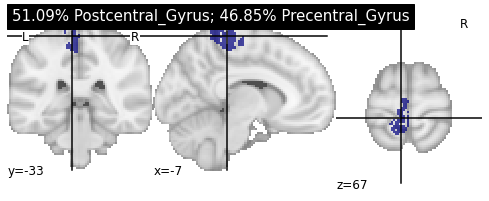

175


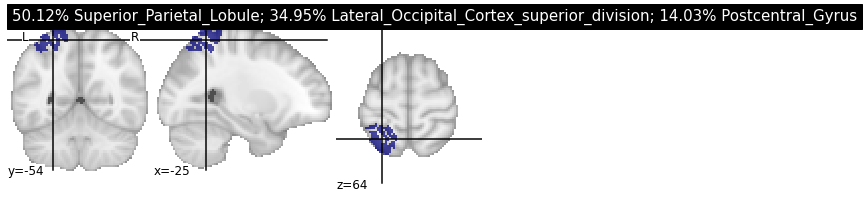

176


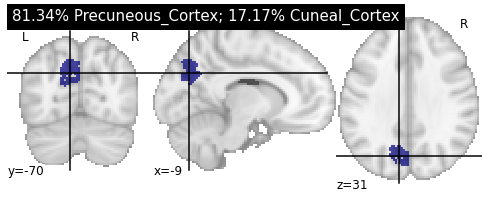

177


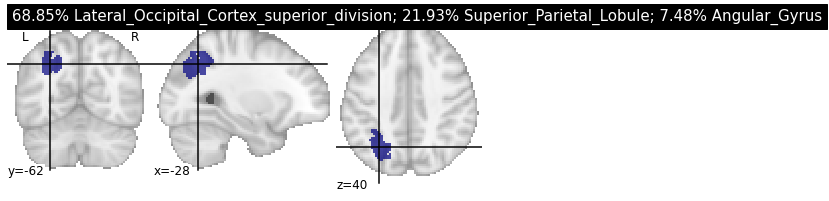

178


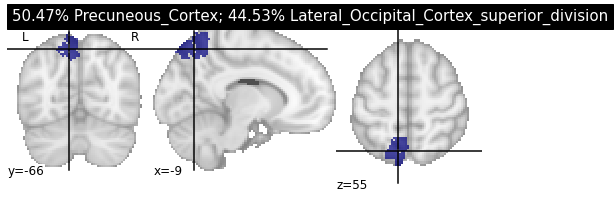

179


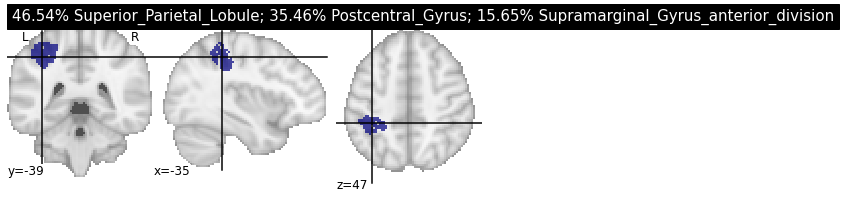

180


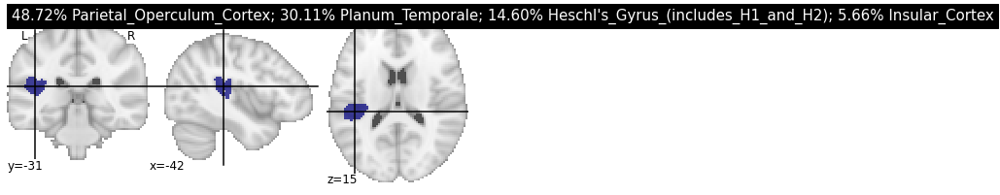

181


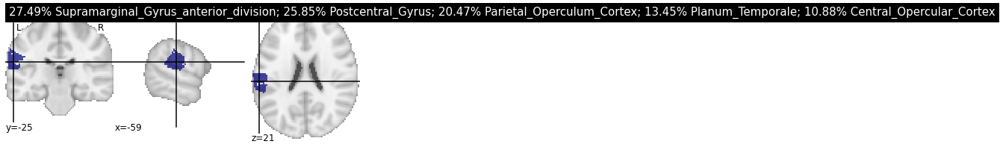

182


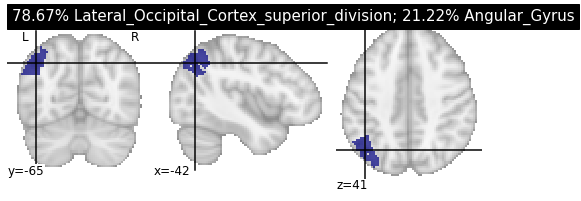

183


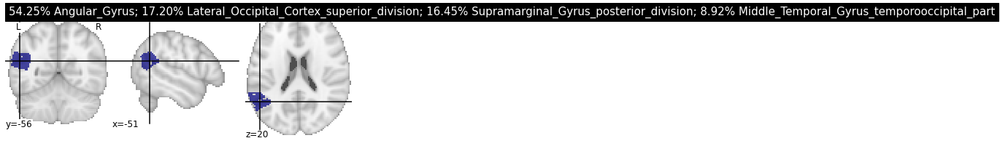

184


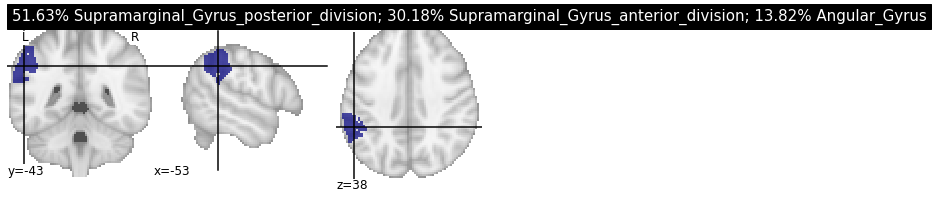

185


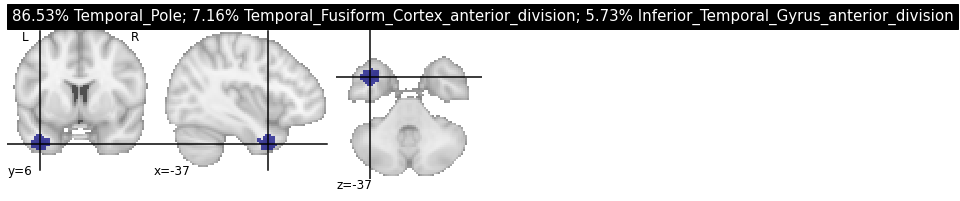

186


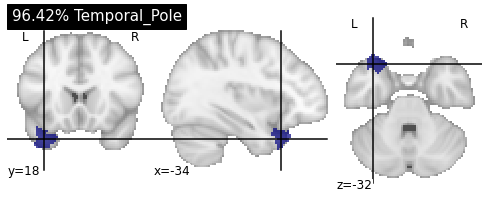

187


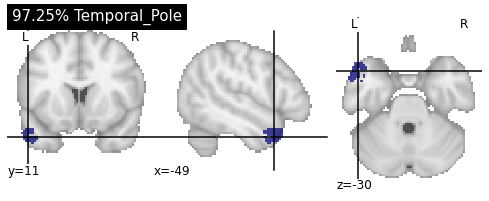

188


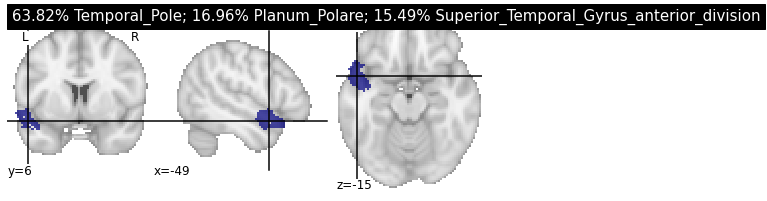

189


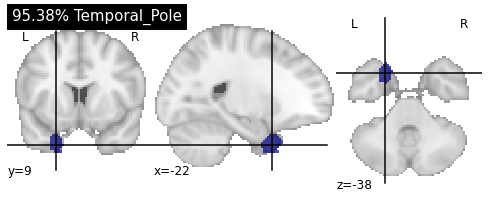

190


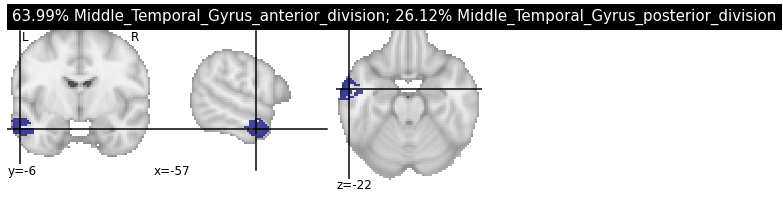

191


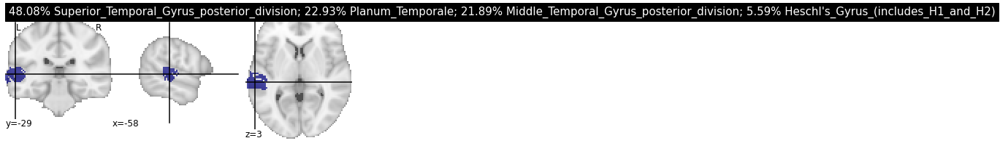

192


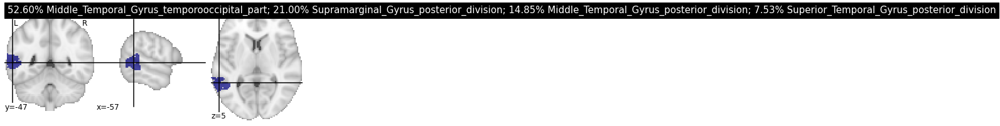

193


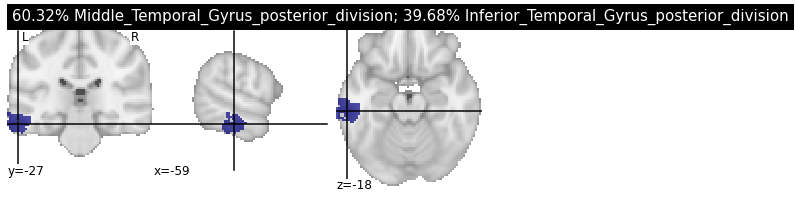

194


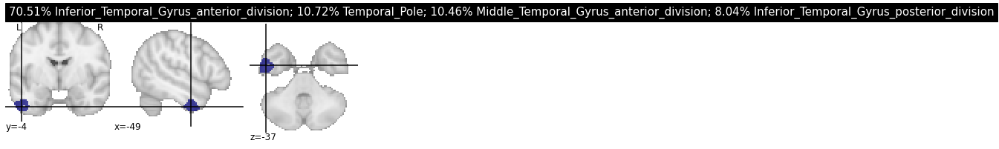

195


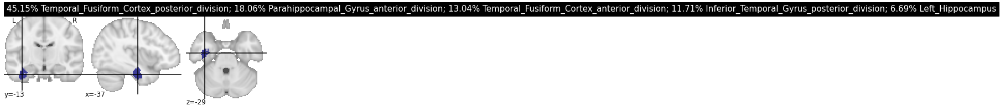

196


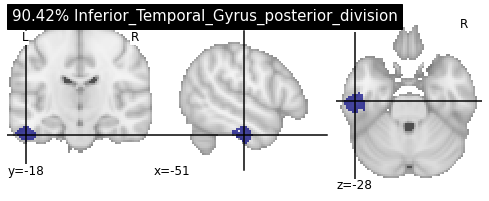

197


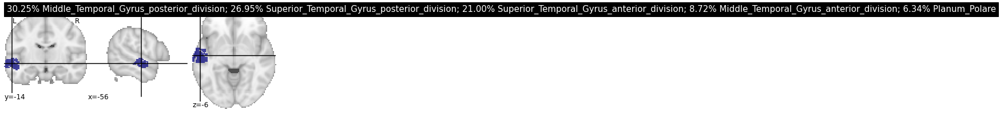

198


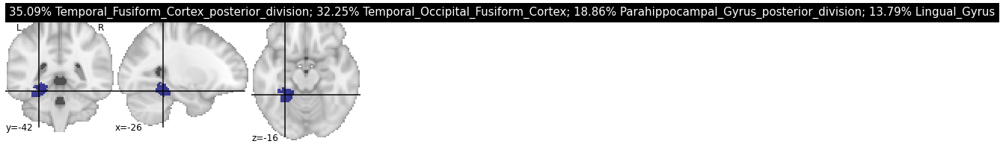

199


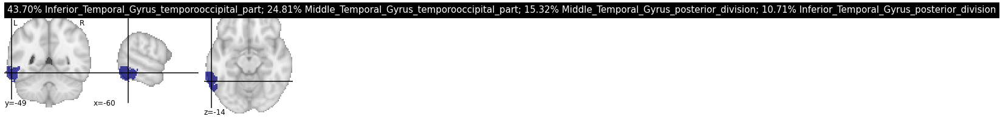

200


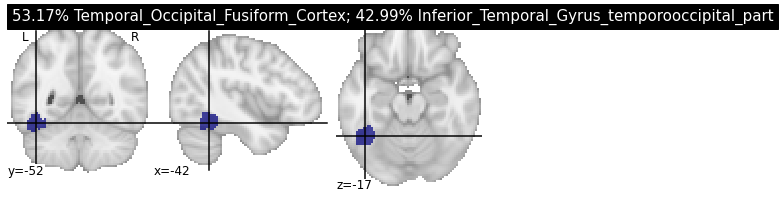

201


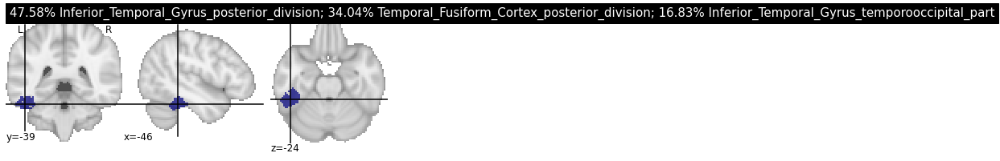

202


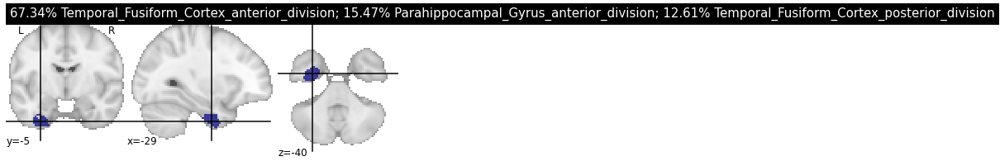

203


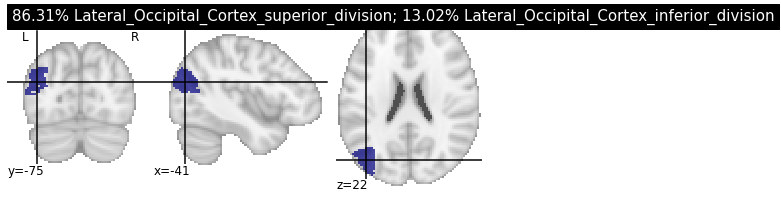

204


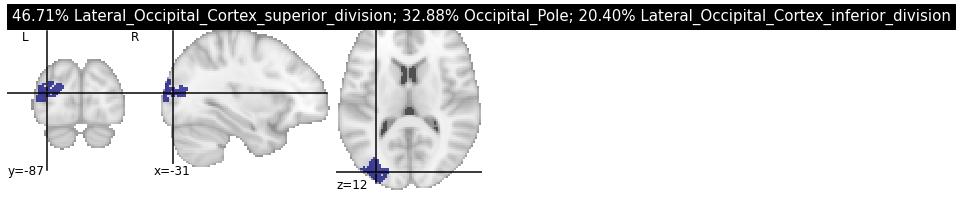

205


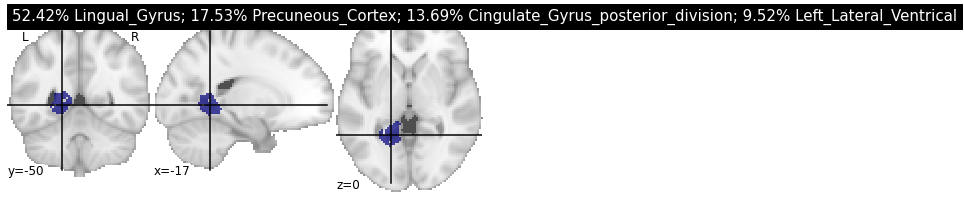

206


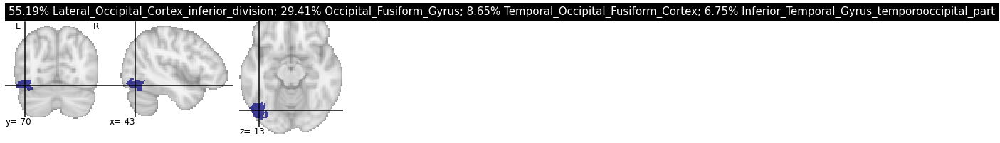

207


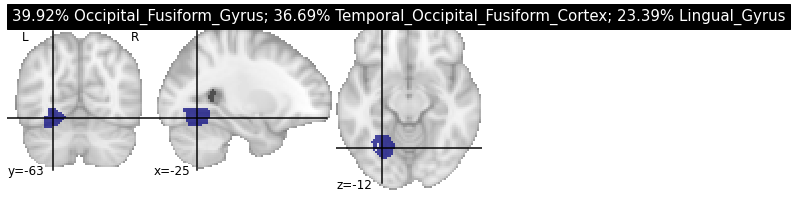

208


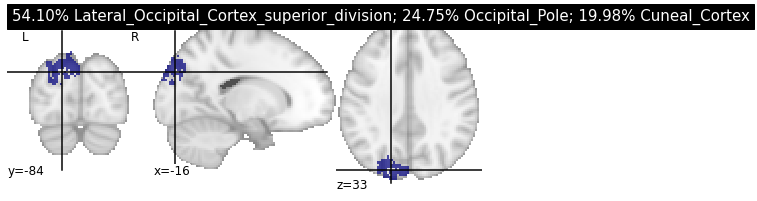

209


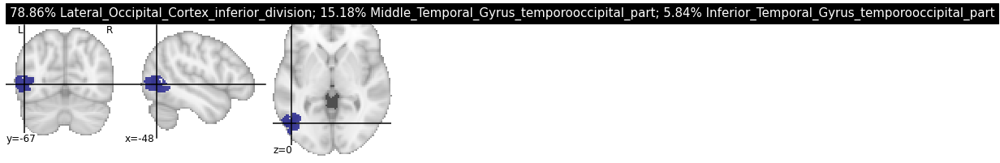

210


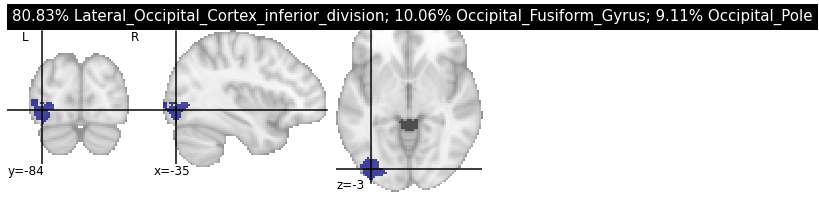

211


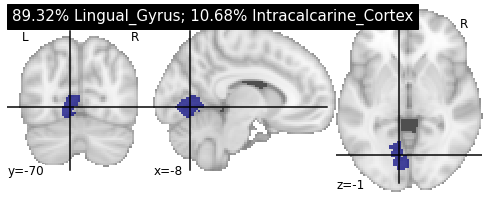

212


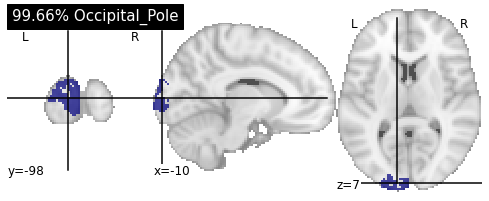

213


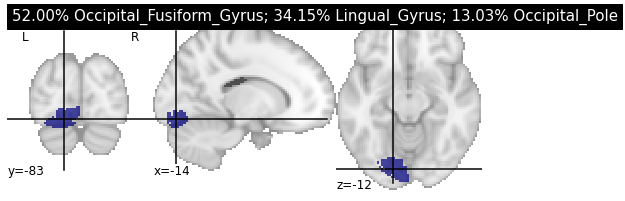

214


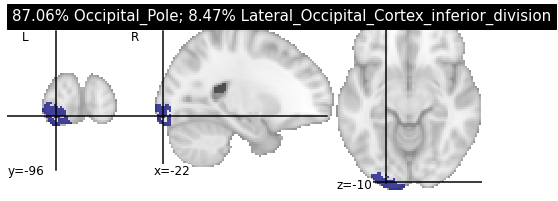

215


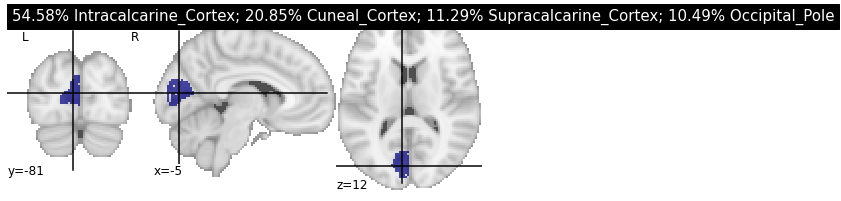

216


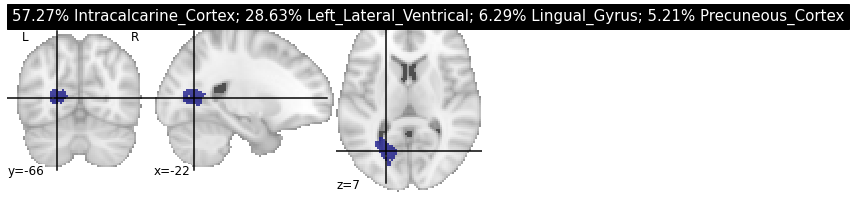

217


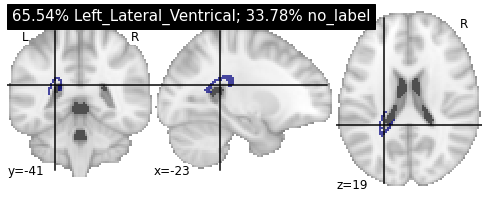

218


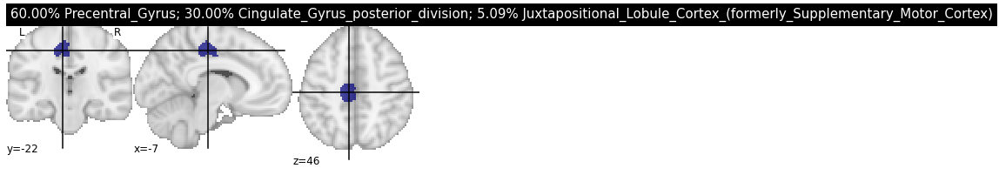

219


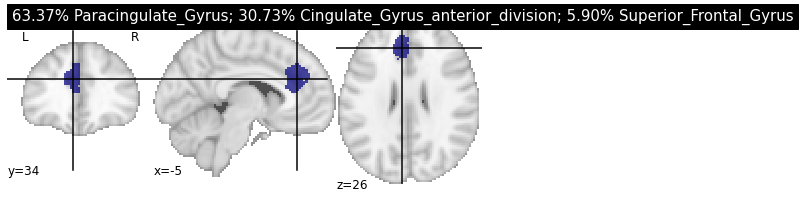

220


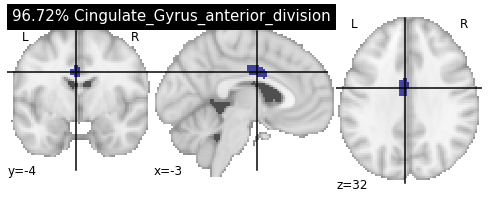

221


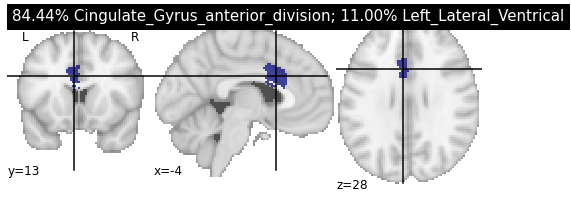

222


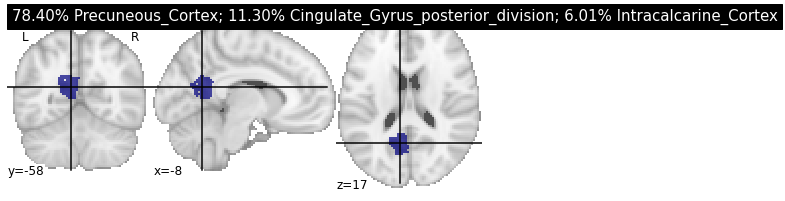

223


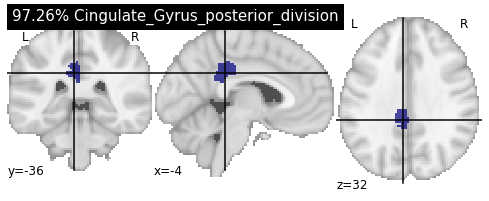

224


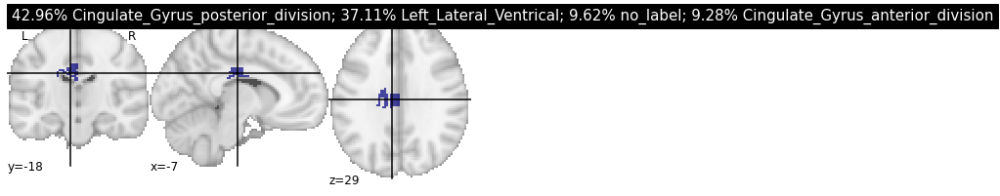

225


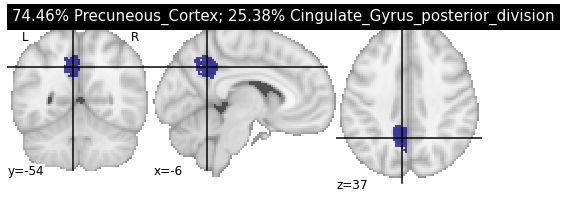

226


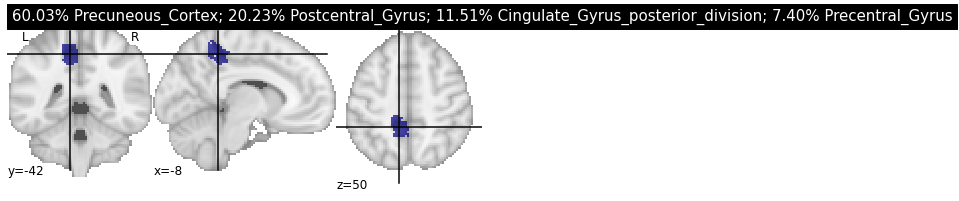

227


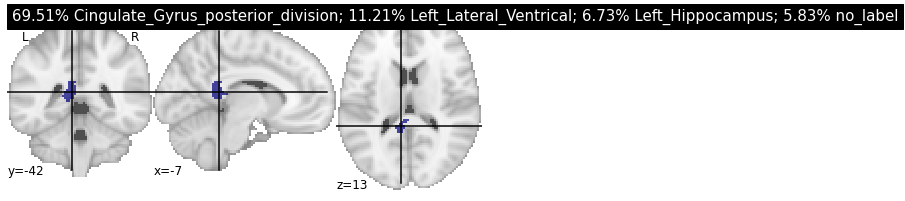

228


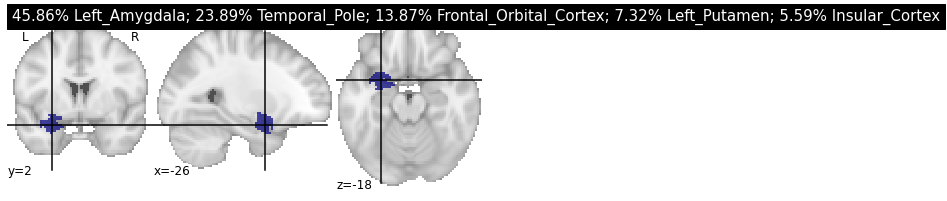

229


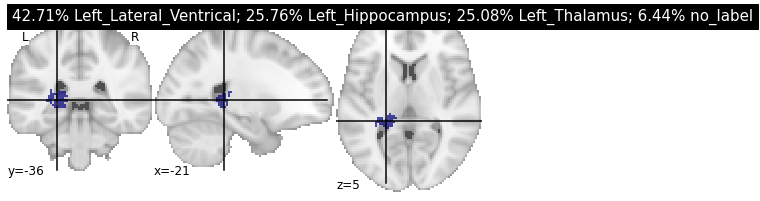

230


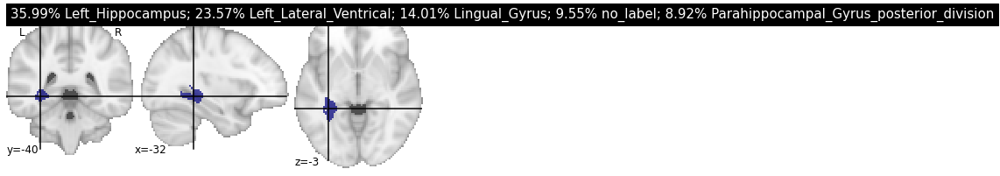

231


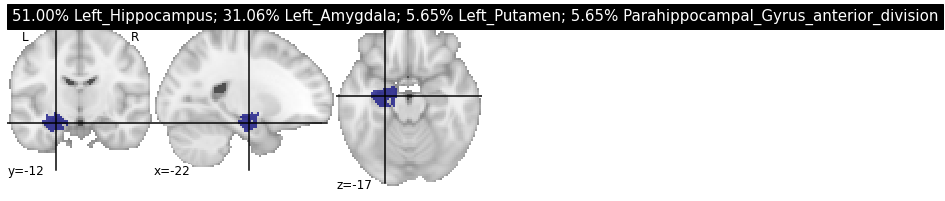

232


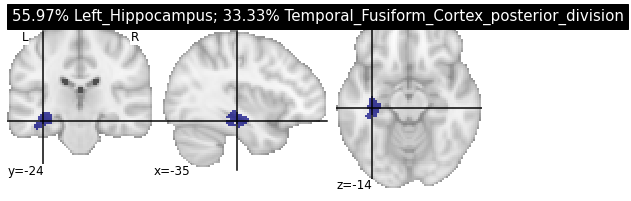

233


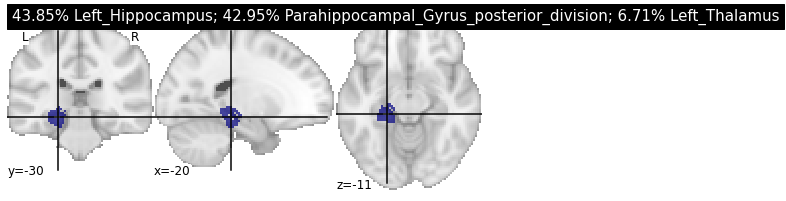

234


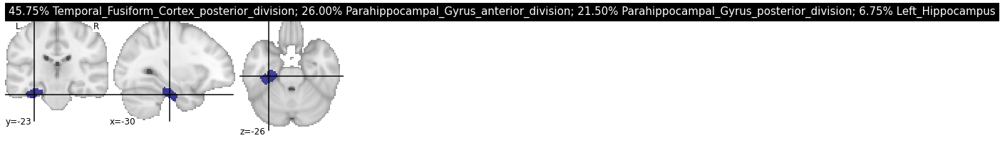

235


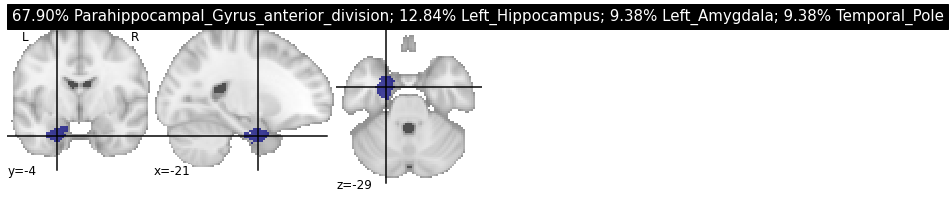

236


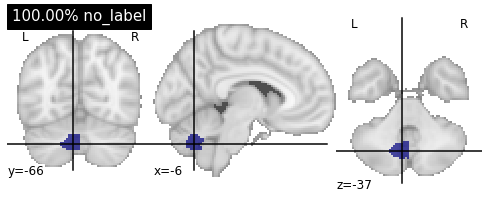

237


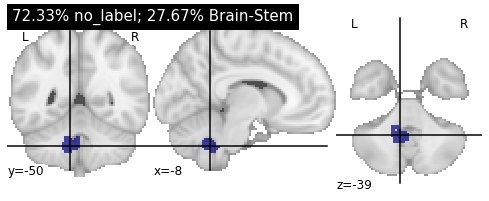

238


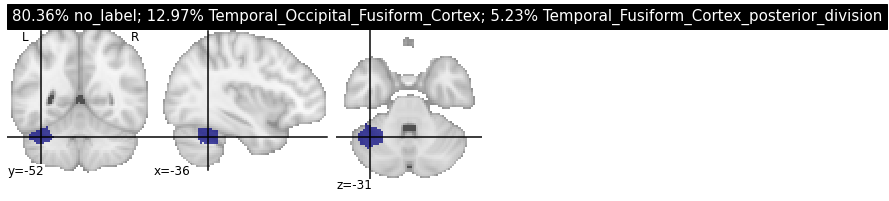

239


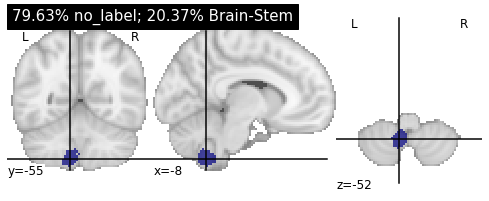

240


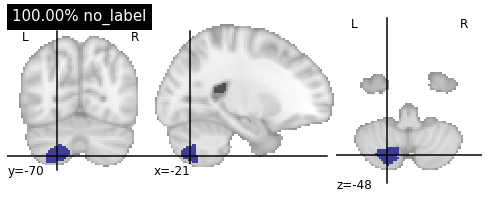

241


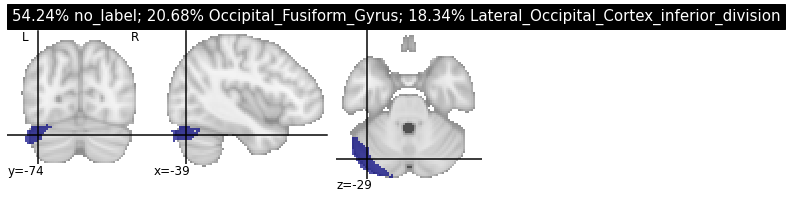

242


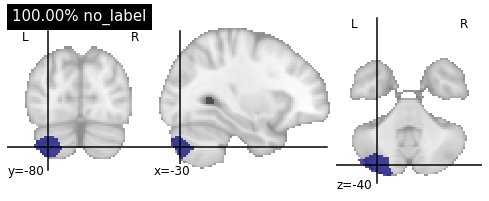

243


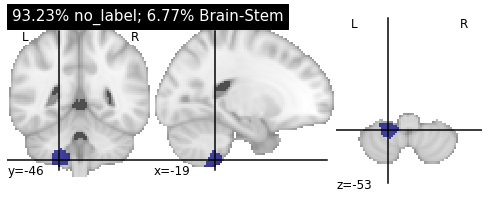

244


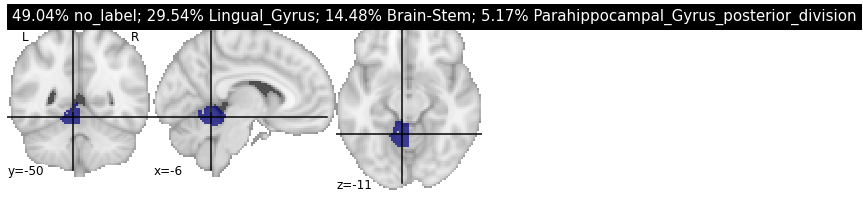

245


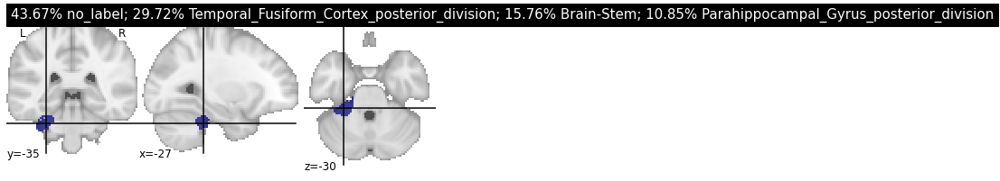

246


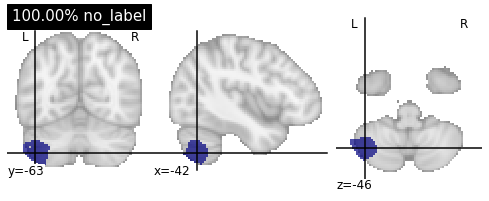

247


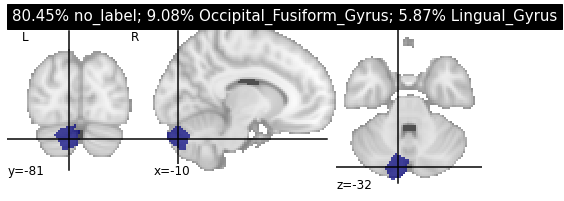

248


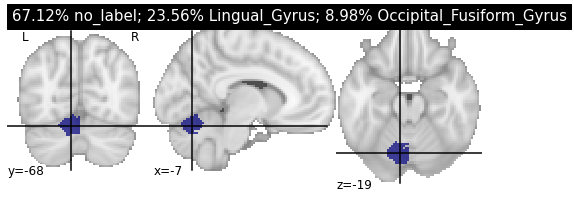

249


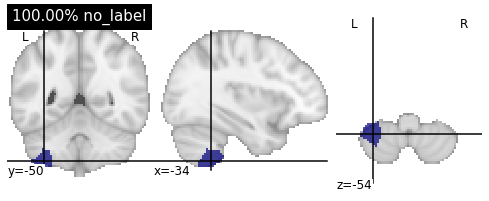

250


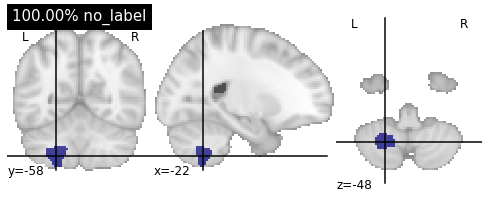

251


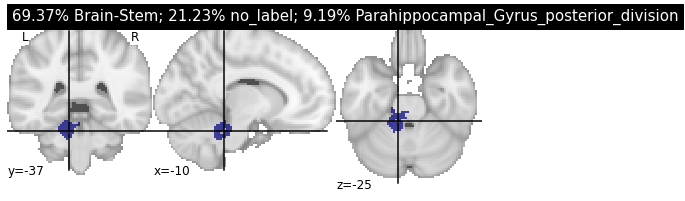

252


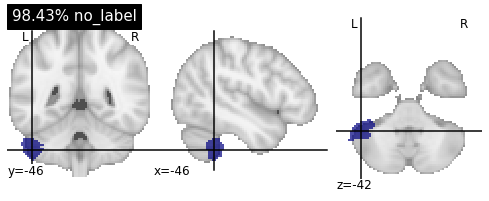

253


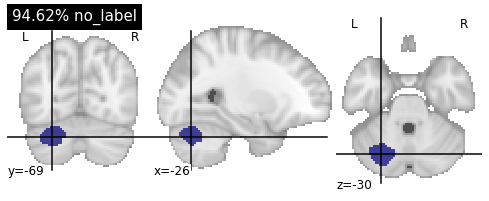

254


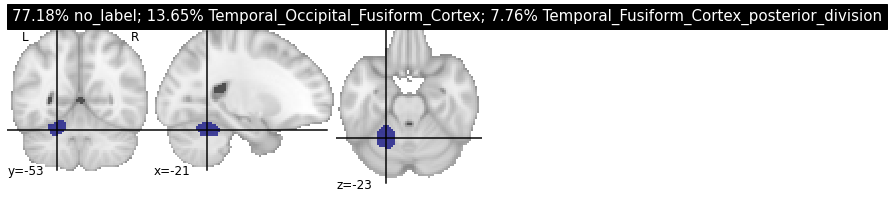

255


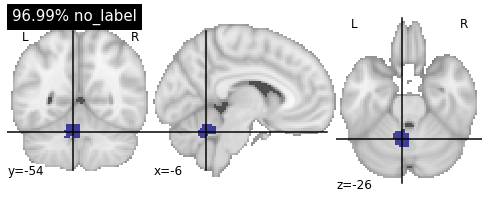

256


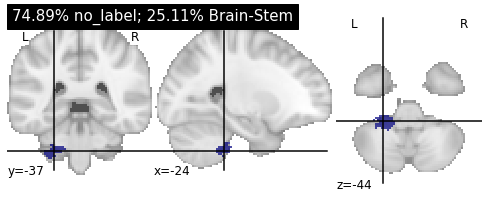

257


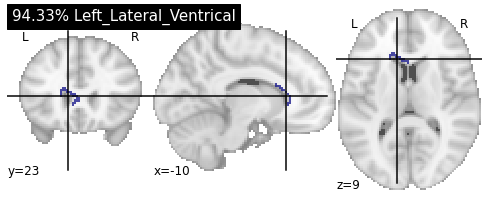

258


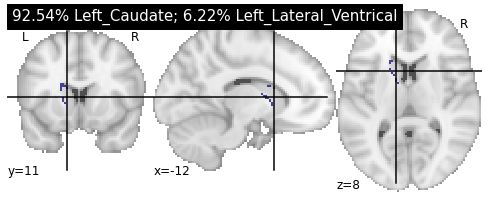

259


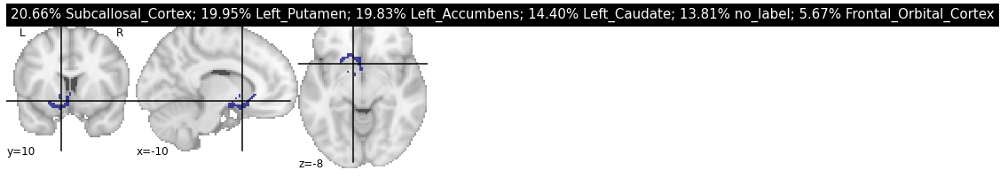

260


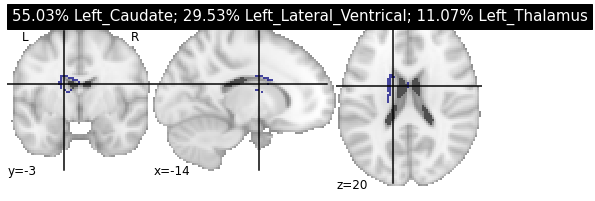

261


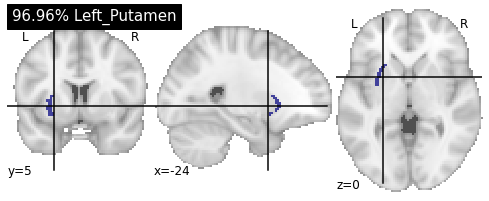

262


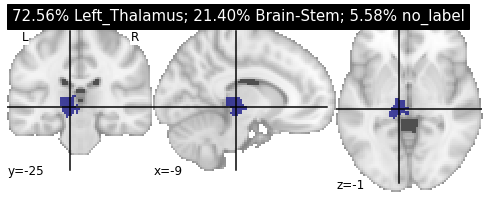

263


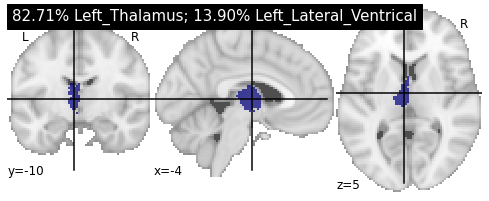

264


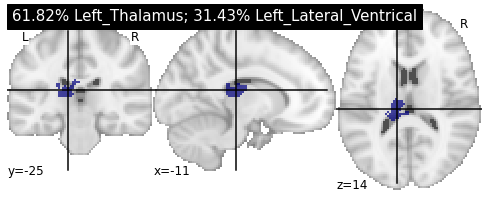

265


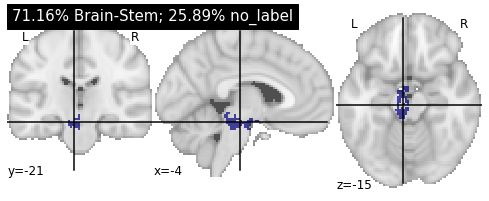

266


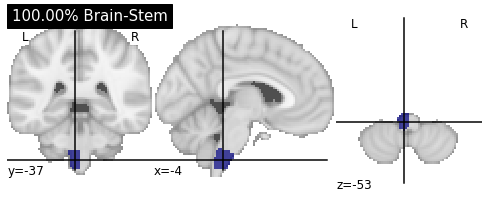

267


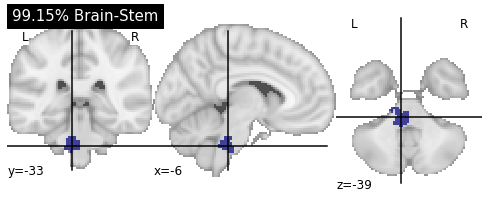

268


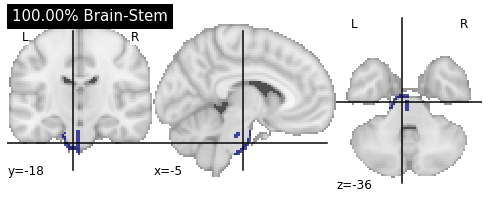

269


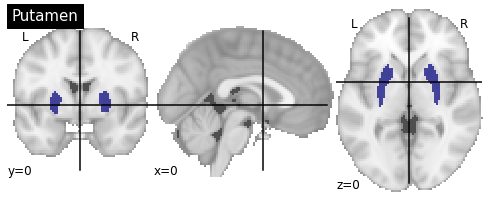

270


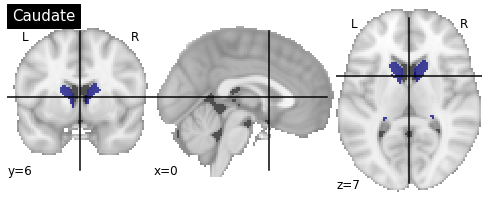

271


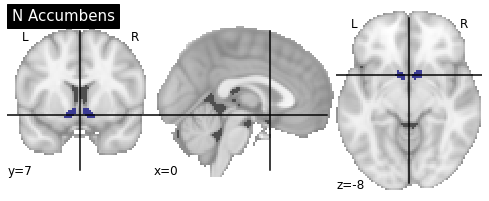

272


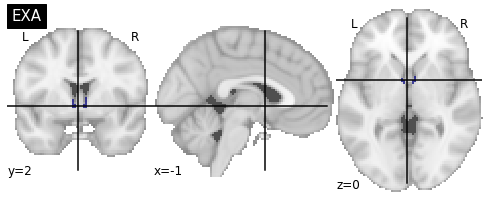

273


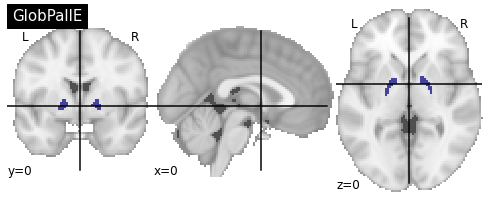

274


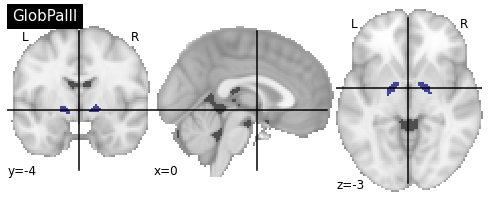

275


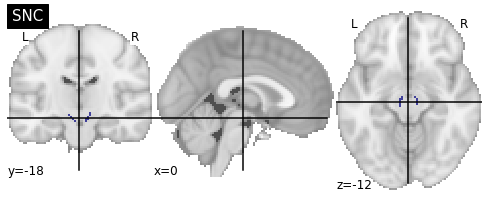

276


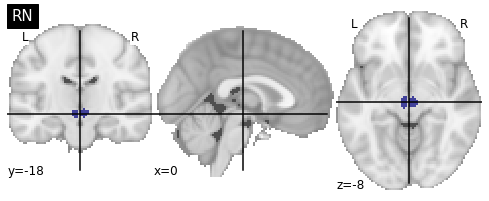

277


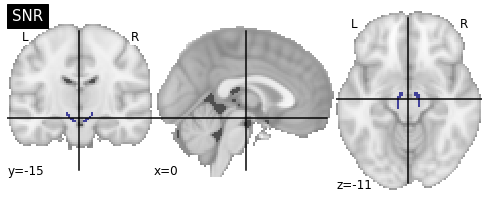

278


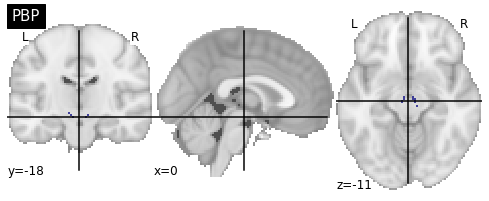

279


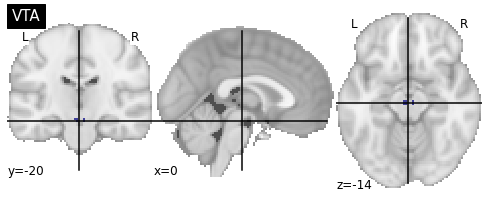

280


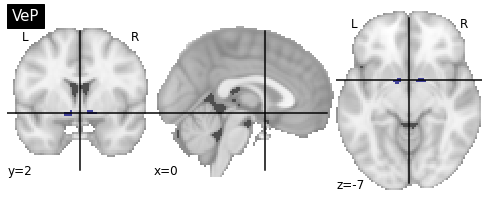

281


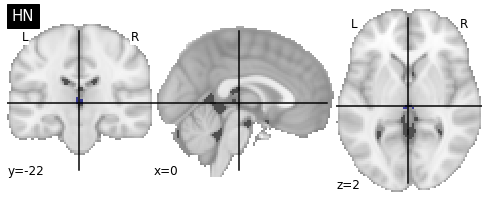

282


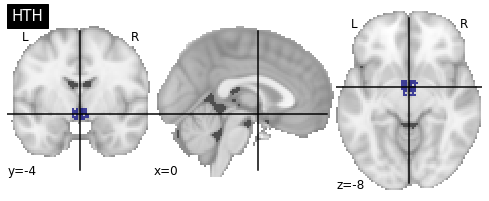

283


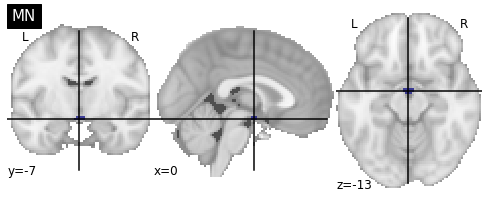

284


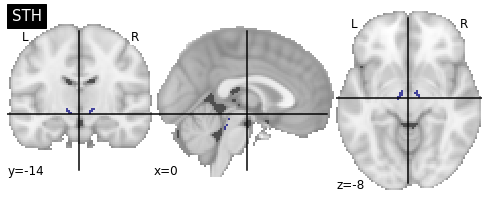

285


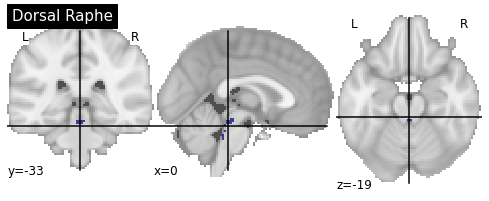

286


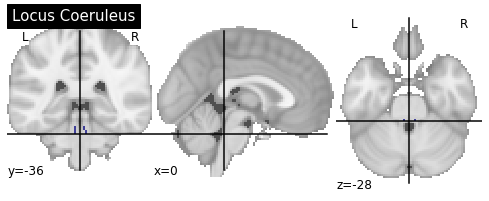

287


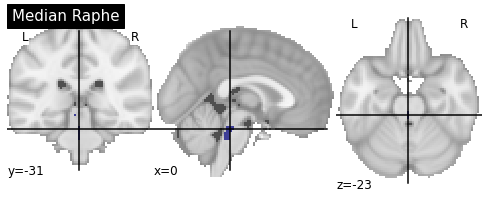

288


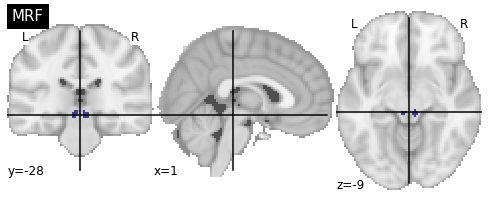

289


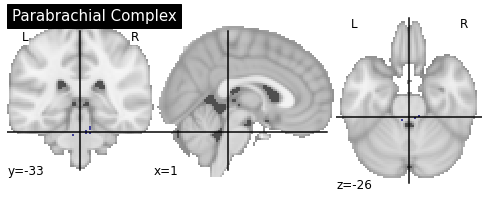

290


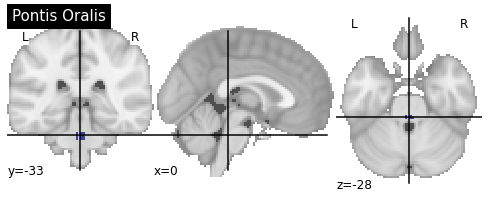

291


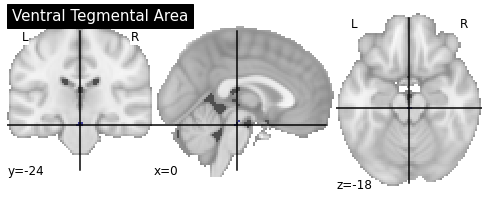

292


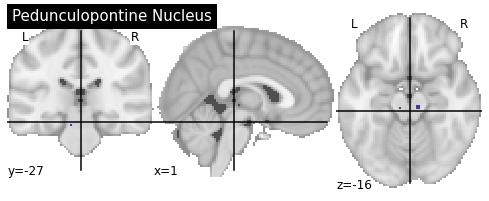

In [93]:
for current_value in range(1,293):
    print(current_value)
    all_img = nilearn.image.load_img(all_file)
    all_data = all_img.get_fdata()
    #print(all_data.shape)

    all_data[np.where(all_data!= current_value)] = 0
    all_new_img = new_img_like(all_img, all_data.astype(int))

    current_title = my_dict[current_value]['name']

    plotting.plot_roi( all_new_img,
                       cut_coords = my_dict[current_value]['coords'],
                       title = current_title);
    plt.show()

269
[0.8504801097393653, 0.6063100137174189, 0.24691358024691112]


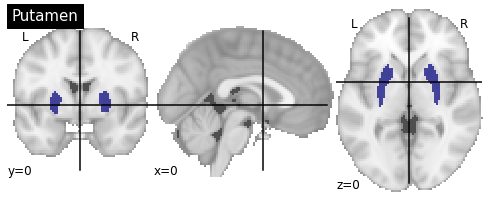

270
[0.5027237354085656, 6.9214007782101135, 7.962645914396887]


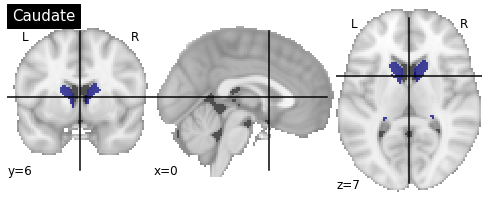

271
[0.6507936507936449, 7.69841269841271, -8.841269841269842]


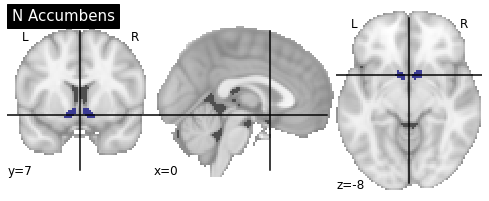

272
[-1.0, 2.235294117647072, -0.3529411764705941]


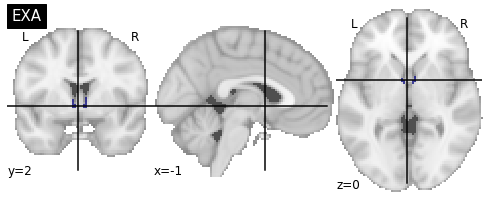

273
[0.4083769633507899, -0.9109947643979126, -0.46073298429318754]


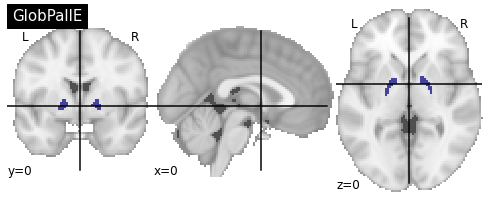

274
[0.07272727272727764, -4.709090909090904, -3.9272727272727224]


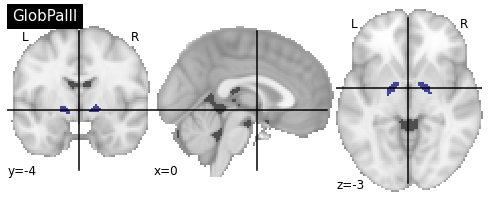

275
[0.1025641025641022, -18.717948717948715, -12.410256410256409]


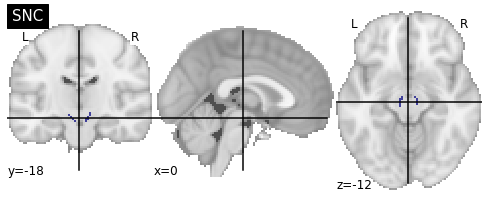

276
[0.4347826086956559, -18.97826086956522, -8.5]


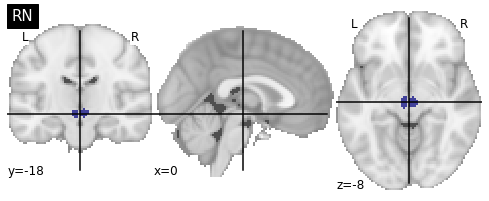

277
[0.14634146341462895, -15.902439024390247, -11.853658536585364]


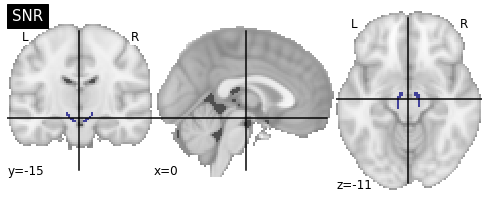

278
[-0.3125, -18.0625, -11.0]


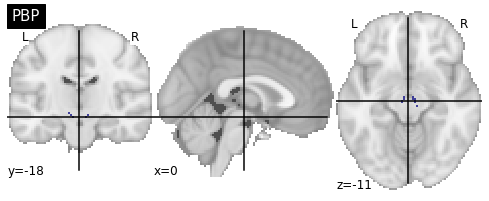

279
[-0.6153846153846132, -20.0, -14.92307692307692]


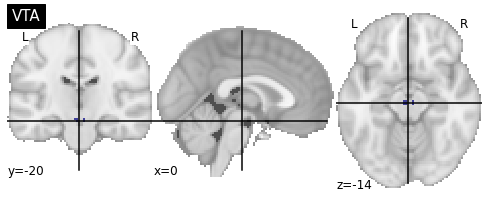

280
[0.7586206896551744, 2.620689655172413, -7.65517241379311]


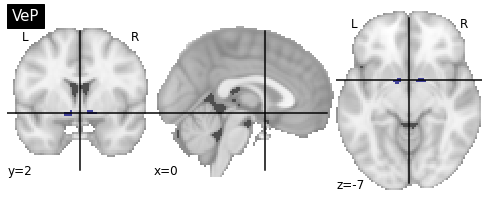

281
[0.0, -22.5, 2.8333333333333286]


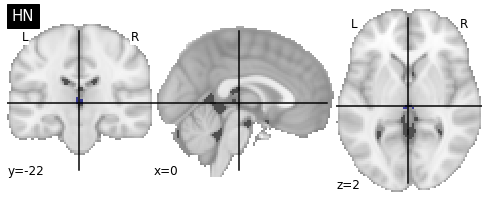

282
[0.4824120603015132, -4.1507537688442255, -8.78391959798995]


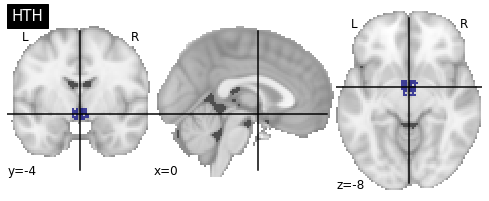

283
[0.1599999999999966, -7.680000000000007, -13.04]


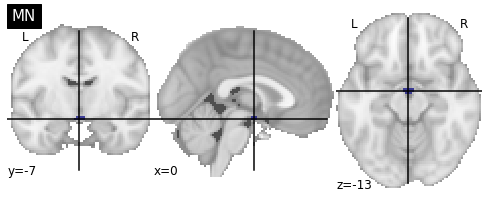

284
[-0.08888888888888857, -14.533333333333331, -8.088888888888889]


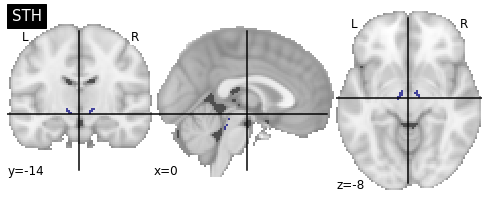

285
[0.625, -33.5625, -19.9375]


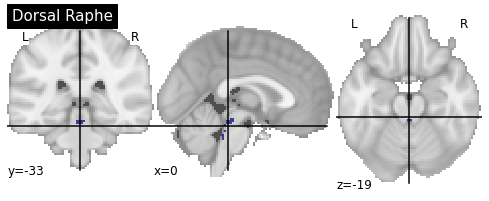

286
[0.4285714285714306, -36.85714285714286, -28.0]


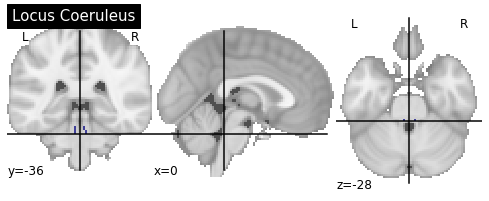

287
[-0.13333333333333997, -31.599999999999994, -23.0]


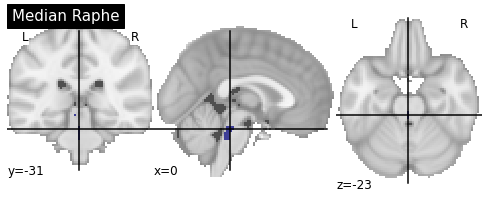

288
[1.0499999999999972, -28.950000000000003, -9.600000000000001]


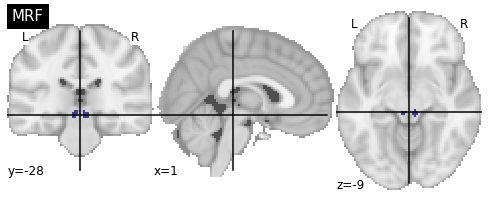

289
[1.1111111111111143, -33.77777777777777, -26.333333333333336]


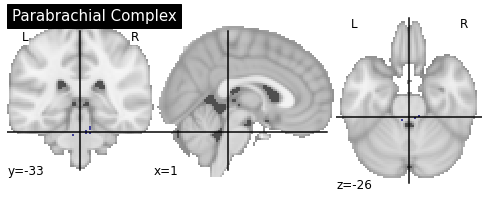

290
[0.7741935483871032, -33.29032258064517, -28.645161290322584]


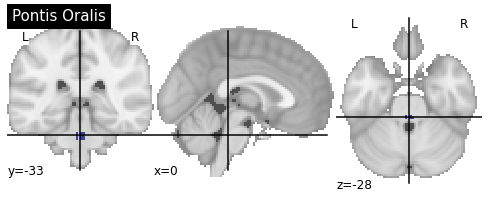

291
[0.5999999999999943, -24.400000000000006, -18.799999999999997]


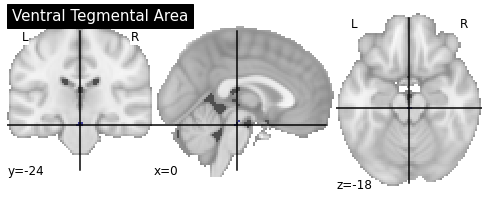

292
[1.5555555555555571, -27.22222222222223, -16.22222222222222]


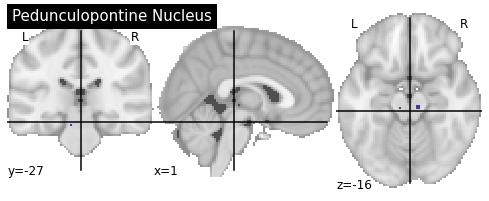

293
[0.7586206896551744, -32.27586206896552, -10.448275862068968]


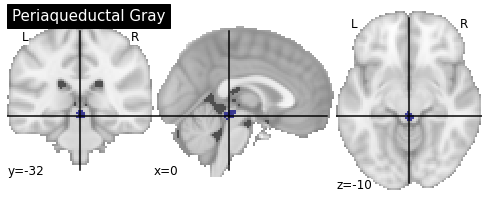

In [73]:
for current_value in range(1,294):
    print(current_value)
    all_img = nilearn.image.load_img(all_file)
    all_data = all_img.get_fdata()
    #print(all_data.shape)

    all_data[np.where(all_data!= current_value)] = 0
    all_new_img = new_img_like(all_img, all_data.astype(int))

    current_title = shen_dict[current_value]['name']
    
    coords = plotting.find_xyz_cut_coords(all_new_img)
    print(coords)
    plotting.plot_roi( all_new_img,
                       cut_coords = coords,
                       title = current_title);
    plt.show()